In [1]:
!pip install -q tensorflow==2.2

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.preprocessing.text import Tokenizer
from keras.callbacks import EarlyStopping
from keras.models import Sequential
import re, string, time, random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from PIL import Image
from kaggle_datasets import KaggleDatasets

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os, csv, collections
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/118668756.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3592992234.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/929679367.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/730083159.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2196050115.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1968453344.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4418471031.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2652311904.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2044546977.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/239807547.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2977128559.jpg
/kaggle/input/fl

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/122202217.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2893238950.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2824492858.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3179278412.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4814923452.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6087966524.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6864936264.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/427936315.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/111061041.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/95758790.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2390286467.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/468709485.jp

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2792195540.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4770851749.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/110647073.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3390808454.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4948125167.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4316023148.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4775815811.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/20249851.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5996795291.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2528395479.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2672634212.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2075321027

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3174156702.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6977076039.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6633366731.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4648976228.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/296349520.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4950889937.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4145054037.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3410519828.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1587652280.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/495014499.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/8140263558.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/471575503

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7004977742.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4488011793.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/780605882.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2904676815.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/301582255.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1338067602.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2969370354.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6647902055.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4957517464.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3732025003.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4107474314.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/320389748

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4764493697.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4934630252.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4093912245.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3666324102.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5738179350.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7426852574.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/288177922.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5821135681.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2594336381.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/382138122.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/534313000.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/539744890.

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4960199915.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2322046574.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/33465647.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3340857141.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/160805827.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2565237642.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3856960370.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3194533056.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/512991147.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3654402537.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2394922193.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4475326892.

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6077671447.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/476496952.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/531261613.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1337792872.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4558577575.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3445338069.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4890093788.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4030638908.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3565021218.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4872490297.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3609952704.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/185188962

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2231843419.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6417423499.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3350785999.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/253320564.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/751497345.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2997939824.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1457162537.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4717486227.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6609340299.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1624481.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1479028910.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3798412244.j

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3429115635.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2191453879.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4551202777.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3132619510.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4906688039.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2230693384.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6168223686.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2645745905.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4672453085.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2900701525.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/8011169691.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2304938

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3550763985.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/506485519.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3516087269.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1061887159.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7709367894.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2556650904.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2972925005.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2600967348.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/336551609.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4565044083.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/460326010.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4750040931

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/38137970.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2812590023.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7301265688.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3044536048.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2800004913.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2221241506.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/149806768.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/318309410.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/265086707.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2797185895.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4859164621.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4378823.jpg


/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2326294409.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5417456446.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/164200567.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4749166996.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/878355466.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3110840233.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3091010827.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7300169048.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3652859271.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3713133789.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2741388782.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/357199608

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4833879670.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2229177914.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4652665785.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3411022255.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2745588751.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4932685389.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3046902524.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3012517885.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2572604969.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4646500246.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1683444418.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2659554

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/523249012.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3433259846.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/311406998.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3127888173.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3703413486.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4563544127.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/453756106.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3243866702.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4504942600.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7643054168.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3344226994.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4443034596

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3247693965.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3521201948.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2705925410.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2111360187.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3450087996.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2429505595.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/108503753.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4923916404.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5679390502.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/281419391.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4613883258.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/229195812

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/449687289.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/170614554.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3936738389.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3091338773.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4458801621.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3563924606.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6180215411.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3677514746.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2052202553.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4688204116.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/259510411.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2766726291

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5501340599.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3109780402.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2550756380.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4636054805.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2774430374.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4986906449.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4389771247.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4589055346.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3437781040.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6828313172.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4405699723.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/9228907

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/295229746.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2346564235.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3963089141.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3584812840.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4918025501.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6907486478.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4588427619.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2807545270.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4743795506.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2882925081.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/5121831412.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/23727514

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/118668756.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3592992234.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/929679367.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/730083159.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2196050115.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1968453344.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4418471031.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2652311904.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2044546977.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/23980754

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3501313414.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4692047783.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/854333409.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3691670743.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2034882405.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3958204411.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3451344589.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4450688406.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3208417638.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/397451

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1354318519.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4045308081.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4556421643.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6043197241.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2021602343.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5196647928.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/101958970.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/7148370683.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2515247156.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/942324

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1798209205.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3813902547.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6808765474.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5823813436.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4589045905.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1703971772.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3609032038.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5870433117.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3419634480.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/30416

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4953541345.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/840202638.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5715657613.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4493641563.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4923792309.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3044746136.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2888732432.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4571013172.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/102617084.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/8086165

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5218695756.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6954663021.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2511786415.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1408554531.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3173157541.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3251187785.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2916015337.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3358380484.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4825534547.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/13901

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1188199432.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2133650765.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/106300392.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/111285749.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3429351964.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/7591663030.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6250527395.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/8174939463.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/592492743.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/78126121

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/181967064.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5651210045.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6090223025.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3455898176.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6274424188.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3391716619.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2325386353.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/443756591.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2724761798.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1215566

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2961192837.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3562903245.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/65847949.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3216762979.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3172283002.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2578952418.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4695672886.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/178980177.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1138784872.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/44345779

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4954088684.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2695974995.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2313551145.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3129043236.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/65845718.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4810489376.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5337563702.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2906802485.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2403544744.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2535300

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3360582670.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3503987396.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2762594886.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/791338571.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3646453252.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2071830584.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/7711598144.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4810828117.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4844407687.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/400392

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4445485475.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3026374370.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3608022021.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/521750280.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3468130925.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4752206307.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4615743138.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/708945669.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5694314894.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2602679

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/214417276.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3389321512.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3293751136.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/1664475761.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3496411891.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/8008888211.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/492587970.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4352857810.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6957006310.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3133044

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4729408045.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4833520397.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/416272701.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2428751994.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4683142737.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3324049172.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/7094822129.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4297543039.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2471525587.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/467631

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3827311036.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3323514651.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3470711198.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3504662140.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4467098318.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3427301653.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/100652400.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/374539133.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/304998314.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/28885170

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3214151585.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4563270564.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2183123018.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/7778048288.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/73636277.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4898180180.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6276644870.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3795409752.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2553188198.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5019605

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2071273039.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4716376540.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/933118213.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/44401148.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/6453399365.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4860722428.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5982829174.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3443351431.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4817683058.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/37995630

/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/522712748.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3491013009.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/4535251327.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/5126446040.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/2079499010.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/526619673.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/300777683.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/621668012.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/3605440115.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/375384566

In [3]:
USE_PREVIOUS_SAVE = True
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

Running on TPU  grpc://10.0.0.2:8470
REPLICAS:  8


In [4]:
LOCAL_FLICKR_PATH = '/kaggle/input/flickr-image-dataset/flickr30k_images/'
annotation_file = LOCAL_FLICKR_PATH + 'results.csv'
LOCAL_IMG_PATH = LOCAL_FLICKR_PATH + 'flickr30k_images/'

!ls {LOCAL_IMG_PATH} | wc

  31785   31785  468996


In [5]:
%%time
if strategy.num_replicas_in_sync == 8:
    GCS_DS_PATH = KaggleDatasets().get_gcs_path('flickr-image-dataset') # 8gb # 20-25 mins
    print('yeah')

yeah
CPU times: user 12.8 ms, sys: 5.96 ms, total: 18.7 ms
Wall time: 416 ms


In [6]:
if strategy.num_replicas_in_sync == 8:
    # print(GCS_DS_PATH_FLICKR)
    # !gsutil ls $GCS_DS_PATH_FLICKR

    print(GCS_DS_PATH)
    !gsutil ls $GCS_DS_PATH
    
    FLICKR_PATH = GCS_DS_PATH + '/flickr30k_images/'
    IMG_PATH = FLICKR_PATH + 'flickr30k_images/'
    # less than 10sec
    !gsutil ls {IMG_PATH} | wc
else: 
    FLICKR_PATH = LOCAL_FLICKR_PATH
    IMG_PATH = LOCAL_IMG_PATH

gs://kds-350aadf7f8c712c1a48a0280b574aeb6079636c727f1fe326e0db210
gs://kds-350aadf7f8c712c1a48a0280b574aeb6079636c727f1fe326e0db210/flickr30k_images/
  31785   31785 3647497


In [7]:
image_caption = collections.defaultdict(list)
prepath='/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/'
anotation = '/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv'
with open(anotation, 'r') as f:
    next(f)
    anotation_list = csv.reader(f)
    for row in anotation_list:
        split_str = ','.join(row).split('| ')
        print(split_str[-1])
        caption = f"<start> {split_str[-1]} <end>"
        image_caption[IMG_PATH+split_str[0]].append(caption)

Two young guys with shaggy hair look at their hands while hanging out in the yard .
Two young , White males are outside near many bushes .
Two men in green shirts are standing in a yard .
A man in a blue shirt standing in a garden .
Two friends enjoy time spent together .
Several men in hard hats are operating a giant pulley system .
Workers look down from up above on a piece of equipment .
Two men working on a machine wearing hard hats .
Four men on top of a tall structure .
Three men on a large rig .
A child in a pink dress is climbing up a set of stairs in an entry way .
A little girl in a pink dress going into a wooden cabin .
A little girl climbing the stairs to her playhouse .
A little girl climbing into a wooden playhouse 
A girl going into a wooden building .
Someone in a blue shirt and hat is standing on stair and leaning against a window .
A man in a blue shirt is standing on a ladder cleaning a window .
A man on a ladder cleans the window of a tall building .
man in blue shi

A blond toddler walks in a field .
A child walks in a grassy field .
A man is cooking what appears to be green beans in a grill basket on a grill with a yellow lab standing by him while someone takes a picture from above .
A man and his dog are grilling green beans on a grill .
A man grilling vegetables on a patio with his dog .
A man and a dog grilling green beans .
Guy and his dog cooking outside
Three people are on a hilltop overlooking a green valley .
People sit on the mountainside and check out the view .
Three people rest on a ledge above the moutains .
Three people hang out on top of a big hill .
Three people overlook a green valley .
A group of tourists is crossing a bridge that connects a walking path to a trail of nature .
Many people cross a very tall footbridge with a tree-covered hill in the background .
This shows a group of people walking over an arched red bridge .
People cross a large bridge to get over the body of water .
People walking over a white and red bridge ov

a young woman is giving a baby a ride on her shoulders .
A woman gives a small child a piggyback ride .
A woman is resting against a cross shaped pole while looking towards a large body of water .
A person overlooking the view from above , while leaning on a cross .
A woman leaning against a white cross looking at the ocean below .
Woman on a hill by a white cross overlooking a beach .
A person stands by a white cross overlooking a bay .
A group of people on a riverbank some sitting on the grass some standing .
Several people sitting and standing on a grassy area next to the water .
Four girls are sitting in the grass while several men stand near them .
A group of people are gathered near the water .
People gather in a grassy area near a lake .
A male volleyball player in red trunks tries to block the shot of the opposing player during a professional volleyball game .
Men playing volleyball , with one player missing the ball but hands still in the air .
A group of spectators watch a me

A young boy is walking in front of some stores
A girl in green walks down a city street .
A small child walks down a sidewalk .
A group of local cheerleaders in red and white kept our spirits up during the parade .
A group of cheerleaders cheering on the street , dressed in red and white .
Cheerleaders in red and white uniforms cheering in the street .
Women are cheerleading in the street .
A group of girls are cheering .
A man in a brown uniform reaching out from an industrial doorway , as if he is going to shut the door .
A man is inside a truck looking out with his left arm in front of a door .
A man in a brown shirt prepares to close the door .
A delivery man exiting the back of a truck .
A man opening a door and looking out .
A boy in a red soccer strip is holding his boots in his hand whilst stepping out of a car .
A young boy gets out of the van and prepares his shoes for wear during a soccer game .
A boy dressed in soccer attire and holding his shoes getting out of a car .
A ch

A man in a baseball tee-shirt is sweeping what appears to be an empty pond in a festive looking backyard .
A man is sweeping a large blue surface that has " Rock Bowl " written on it .
A man is sweeping the bottom of an empty shallow pool .
Guy in a hat , he is cleaning out an empty pool .
A barefoot young girl in a pink gown is asleep on a hard wood floor cuddling her baby doll .
A little girl dressed in a princess costume , asleep on a wood floor .
There is a girl in all pink sleeping on the floor with her dolls .
a girl sleeping with a baby doll wearing a princess costume
A child dressed in a princess outfit sleeping .
Person in a brown sweatshirt does a flip in midair over a trampoline with a river and electrical lines in the background .
A young adult is doing a back flip on a trampoline near a lake .
A woman is doing flips on a trampoline in front of a lake .
A woman does a somersault on a trampoline on the beach .
Trampolines are a fun way to exercise .
A female washes her mediu

Workers on a break in front of the Atari building .
Construction workers in front of a large building .
Some construction workers are taking a break .
Construction workers on a lunch break .
A woman ventriloquist is playing with her colorful green and red dragon in a beautiful garden backdrop .
A woman in a bright green sweater is playing with a dragon puppet a garden .
A woman in a yellow shirt is playing with a dragon puppet .
A woman in a green dress holding a toy dinosaur .
Lady faces off with a green dragon puppet .
A group of mixed aged people are sitting on the sidewalk waiting in a line .
Large amount of people sitting up against the walls of buildings .
A line of people wait to be the first to own the new product .
A large crowd of people are sitting outside of a store .
People waiting for a parade to start on main street .
A woman in a jacket walks on the beach in someone 's footprints while holding her shoes in her hands .
A person is walking along the beach , making footpri

Black and brown dog growling at brown cat hiding under wooden bench .
A dog toys with a cat hiding under a bench .
A snarling dog approaches a hissing cat .
Six people ride mountain bikes through a jungle environment .
Men , surrounded by nature , are riding mountain bikes .
There are six men mountain biking in a forest terrain .
Six People riding bikes on a trail in the forest .
A group of people is bike riding in the woods .
A group of people attending either a concert or a party .
A crowd of people are gathered at some kind of event .
Many people are standing and are watching something .
A crowd is gathered at an outdoor event .
A large gathering of people .
Two women sitting under a tent , one with shirt red-hair , dark clothes drinking and the other laying down playing the guitar in a green top and jean peddle pushers both barefoot .
2 people sit barefoot in a tent , one with a beer and one lounging playing a guitar .
Two young women drink beer and play guitar in tent at outdoor e

A woman works on a piece of computer equipment , while surrounded by a variety of mechanical and computer equipment , in what appears to be some type of laboratory workroom .
A woman with long brunette hair and a beige hoodie is standing near cabinets .
A woman in a yellow shirt works on repairing a computer monitor .
A lady in a brown jacket trying to grab something .
A woman is sticking her hand inside a container .
A skinny guy with long curly hair and glasses is wearing white gloves as he injects something in a bottle
A man wearing white gloves is working in a lab .
A male working in a lab with a hat on .
A man with gloves works in a lab .
A guy is working in a lab .
The little boy fell face first into the grass while playing football .
A boy laying on the grass face down with a football at his feet .
Boy is lying face down in the grass with his foot on a football .
A boy in blue with a football sprawls in the grass .
The boy is on the ground next to the football .
Woman adjusting 

A young boy in a swimming suit sits in water .
A young boy sitting on a water jet in a pool .
A boy sitting in water .
A skinny person wearing and Mondesi jacket and jeans dress shoes is walking down the cemented bridge
A woman in jeans walking along a pathway with green railing .
Woman walking over bridge with teal handrails
A woman is walking alone on a bridge .
A woman walking on a boardwalk .
A woman wearing a short-sleeved striped shirt and carrying a green shopping bag examines fish in an open air market while a vendor in a white apron over a gray t-shirt hands her an empty plastic bag .
An employee is handing a woman a bag while she is browsing through fish on ice at a street market .
A woman at a fish market is looking at the fish that are frozen .
The woman is at marketplace buying fish from an Arabic person .
A lady in a striped shirt is shopping at a fish market .
A lady standing wearing black and has a black mohawk has her arm around a guy with a brown bucket hat , green ca

An elderly man wearing white overalls holding a paintbrush .
A man in a suit dozes on a park bench , with a sign for the subway in the background .
An older man in a suit and salmon tie dozes on a city bench .
A man in a jacket and pink tie sleeps on a park bench .
An old man is napping on a park bench .
a sleeping man in a city area .
A man of the street taking a nap resting his head on a rock . While
A man leans against a large rock during the middle of the day .
A man with a blue baseball cap on is sleeping against a rock .
A man in a plaid shirt napping against a large , gray rock .
A man wearing a hat taking a nap .
Someone wearing a large hat is sitting on colorful blankets working a loom with a pair of men 's dress shoes in front of him .
An adult in brightly colored clothing and hat , is weaving or beading while sitting on brightly colored rugs .
A Hispanic person sitting among colorful fabric making a belt .
A gentleman in traditional garb weaving a blanket in a field .
A man 

A person in a blue shirt is holding a microphone in their hands .
An older man wearing glasses , a baseball cap , a white shirt and a red vest plays a tuba outside a building .
A man wearing a white cap , sunglasses , and red vest is playing a gold sousaphone .
A man in white and red with sunglasses carrying and blowing a very large horn .
A man wearing a magenta vest is playing a large sousaphone .
a senior citizen playing the tuba
The small red-haired girl jumps on the trampoline under the tree by the shed .
A young girl jumping over a railing or a ladder on its side .
The young child with red-hair bounced on the trampoline .
A barefoot redheaded girl jumping over a rail .
a girl jumps on the trampoline .
A woman in a black shirt , jean shorts and white tennis shoes is bowling .
A woman in shorts throwing a bowling ball down a bowling alley .
A woman just releasing a bowling ball down the bowling alley .
This woman is taking her turn during a bowling match .
A woman is bowling in a b

Two law enforcement men wear white cowboy hats while riding in a cart past a red car .
Two officers in uniform ride in an open air fleet vehicle together .
Two officers in uniform chatting in a golf cart .
Two cops in cowboys hats riding on a golf cart .
Two officers sitting in a golf cart .
A man wearing a yellow shirt is riding a large riding lawn mower , which is spraying cut grass behind him ; pine trees are visible in the background .
Younger man in a yellow shirt and tan shorts is moving a dry yard or field with a riding John Deere tractor mover .
A young man in a yellow shirt is mowing the grass in what appears to be a rural area .
A person is cropping grass by driving a mechanical grass cutter vehicle
A man in a yellow t-shirt is mowing grass with a John Deere mower .
A man in a security vest is smiling for the picture .
A uniformed man in a blue security vest is smiling .
A smiling security officer with a blue vest on .
A dark-skinned security officer smiles .
The security gua

Two women are sitting on wooden steps by a lake .
Two girls sitting outside by a body of water .
These ladies both have blondish hair .
Two women are seated near the water .
Two girls sitting by the water .
A young man wearing blue jeans and a t-shirt sits in the grass , with a ball in the air .
A man in a red shirt is sitting on the grass , and a ball is flying towards him .
A man in a pink shirt is sitting in the grass and a ball is in the air .
A man is laying down in the grass at a beautiful park .
A man sitting in the grass as a ball flies by .
A young boy is standing in a classroom trying to make a craft project , but having difficulties , while his classmates watch him .
A blond boy in a yellow shirt surrounded by other children who are all doing crafts in a room decorated with painting .
Young children in a classroom working on an arts and crafts project .
Young Caucasian children working on craft projects in school .
Four children in a classroom setting making art projects .
T

Two dogs stand in the brown grass .
A happy couple dressed for cold weather kissing each other in front of the mountains as the sun sinks down behind them .
A couple stand close together observing the sun setting .
The couple is kissing , while standing facing .
A couple being romantic under the sunset .
Together watching the sunset .
A young man , wearing a red baseball cap backwards with a pen hanging from it , looks ahead with a candid expression .
A man with a red hat and a pen behind his ear looks like he is about to say something .
A man with pierced ears has a pen sticking out from under his red hat .
A man in a red hat looking at something with his eyes really big .
A man with a cap and a shocked expression .
a bald man with a tattooed head stands next to a man with a brown t-shirt in front of a transparent awning .
A bald man with tattoos on his head a face stands with a man in tan with backs turned to the camera .
Two men are standing : one has body modifications and the othe

A city street of Tudor-style buildings , with shops on the ground floor , featuring five window washers on ladders .
Five men are washing windows of alpine style buildings on five ladders .
Men standing on ladders repairing the windows of a building .
Five men on ladders cleaning the outside of a building .
Five workers on ladders working on windows .
A group of workers begin to put up the metal frame of a future building .
A group of workers working on a metal framework similar to scaffolding .
A number of people are climbing up scaffolding .
People climb an odd barred structure .
Men working on construction project .
A large brown , white , and gray dog is running through a forest covered in leaves .
Brown and white dog running through fall leaves on the ground .
The brown dog bounds through the leaves and the underbrush .
A brown and white dog is running through woodland .
A tan long-haired dog is running in the forest
A skateboarder in gray clothes jumps over a boot in front of an 

a woman in a white sweater crossing the street .
Woman standing in a parking lot by vehicles .
A girl walks downhill past some parked cars .
A shirtless child in blue shorts holding up a window screen that has fallen out .
Young boy wearing denim shorts holding a window screen .
A child wearing shorts is moving a window screen .
little boy in blue shorts holding a window screen
A boy tries to put a screen on a window .
A black man is posing for a photo with two other people , showing just their hands , points guns at him .
A man with a white t-shirt and a white shirt with black stripes has two guns pointed at his face .
A black male wearing a white shirt with a striped shirt over top is playing with guns .
A young black man with two guns pointed at his head .
two men pointing guns at another man .
A football player in a red jersey is tackling a football player in a white jersey who is attempting to throw the ball .
A quarterback , in the statue of liberty position , is being held onto 

Three chefs in white uniforms preparing food .
Pastry chefs are lined up sorting pastries .
A man in a red shirt with decorative fringe playing a banjo outdoors with a young girl in a red shirt is next to him beating a drum with her hand .
A man dressed in red and white plays a banjo while others look on .
A man wearing red is playing a banjo in the street .
A man with a red fringed shirt is playing a banjo .
A man wearing a red shirt is playing the banjo
A group of girls are posing together with males nearby .
Five women holding drinks are smiling into the camera .
A group of smiling young women posing together .
A group of partying girls gather for a picture .
Five smiling young ladies at a party .
A woman holding a flower stands in front of a marketplace tableau of vibrant green produce , including , lettuce of various types , cactus , radishes , and various herbs .
A woman with dark hair holds a vegetable as she stands in front of a table full of vegetables .
There are lots of colo

A guy in a suit playing bagpipes next to a girl wearing teal clothing .
a well dressed man playing bagpipes next to a girl
A police officer on a motorcycle is behind a four door sedan on a road with billboards in the distance .
A policeman on a motorcycle is stopped behind a car he pulled over .
A police officers on a motorcycle pulls up behind a silver sedan .
A policeman stopping a vehicle on the side of the road .
a motorcycle cop signaling a driver to pull over
A dog jumps in the snow trying to catch a snowball .
A dog trying to catch a snowball in the snow .
A dog tries to catch a snowball in its mouth .
A brown and black dog playing in the snow .
Dog jumps to catch a snowball .
A large black man with a beard and a smaller framed white male with a receding hair line are professionally dressed and having a conversation while a woman stands looking away in the background .
A representative of the Museum of Modern Art discussing something with a tourist or benefactor , while a woman 

A choir of men standing in a street singing .
A young man leads choir practice in an empty sanctuary .
A group of people practicing performing music .
A man conducts a choir in a cathedral .
A choir practicing in a church .
People are signing in a church .
A choir , in spotlight , standing in a semi-circle , being lead by a conductor , who is in shadow in front of the choir , and wearing a gray and black striped shirt and black pants
The conductor is facing the chorus while they look at their booklets and sing .
A mid sized mixed gender choir sings while the director motions to keep beat .
A man in a striped shirt , conducting a chorus for practice .
A choir singing together being conducted by their conductor .
A black and white spotted dog is jumping over the small stream of water .
A black and white spotted dog jumps over a stream .
A white dog with black spots jumps over a stream .
A spotted dog jumps over a muddy creek .
A dog jumps over a creek .
A man in a safety vest and black h

A woman directing traffic .
A young man with long brown hair and a white shirt sings into a microphone
A blond man passionately sings into the microphone .
A young man is singing into a microphone .
A man in white is singing his heart out .
A man is singing into a microphone .
An old man with a multicolored hat standing is standing front of a earth toned mosaic sign , with foreign language in the tiles .
A person with a multicolored hat stands just behind a mosaic featuring Spanish words and in front of a grassy hill .
A man wearing a gray sweater and striped hat stands in front of a mosaic monument .
An old my in a hat is standing behind a sign .
An old man in a hat standing next to a sign .
Two women , one in a dark colored clothing and one in light colored clothing , rides a water slide .
Two women , who are soaking wet , are riding on a water ride in a barrel .
Two women float in a Busch Gardens barrel through a winding water ride .
Two women are sliding down a water slide in a log

Several people walking past a food cart on a city street .
A vendor on a busy street is selling food .
Picture of a hotdog vendor in the street .
A man is working a hotdog stand .
hotdog stand on a busy street
Two women are embracing in a rather lurid scene and are seen laughing and having fun .
Two women in black and blue clothes laughing and having fun .
A woman is smiling as she plays around with another woman .
two woman playing around and smiling .
Two women having fun outdoors .
A group of six men work on a railroad track dressed in construction green jumpsuits .
Workers in reflective clothing with shovels on a train track .
A group of workers working on a train track .
Construction workers building a railroad .
Workers at a railroad track working .
A woman in a skirt and cowboy hat and a woman in pink pants with an exposed midriff are walking down the street looking at the shops .
Two women walking toward the camera along a sidewalk while wearing a backpack and showing midriff .

Three street musicians are playing in front of pink building .
Three men playing music outside .
The musicians are playing .
Cheerleaders are doing a cheer at a football field .
Cheerleaders build a pyramid near the goal-line .
Cheerleaders have made three people pyramids .
A group of cheerleaders if red outfits .
Cheerleaders are on the field cheering .
Four similarly styled brightly dressed women with long skirts dancing in the sunlight with trees framing their movements in the background .
Mexican women in decorative white dresses perform a dance as part of a parade .
A number of identically costumed women dance outdoors before an audience .
A group of traditional Mexican dancers twirl their flowing skirts .
Mariachi dancers dressed in white dresses twirling for a crowd .
Two jacketed men with double-barreled shotguns carry home prey that they have shot on a hunting trip on a muddy country road .
Two men are walking down a dirt road with guns , as one carries a dead animal from hunt

A father and son are standing outside a barber shop .
A man gives a boy high-fives outside a barber shop .
Four children in bathing suits are sitting in a canoe at the shore of a lake .
Four kids , two girls and two boys going on an adventure in a canoe .
There are four people in a kayak riding along a body of water .
Children sitting in a canoe on a quiet lake .
Children are canoeing on a beautiful lake .
3 safety jacket clad Construction workers appear to be poking something interesting with their shovels .
Three male construction workers are examining something in a field , two of them are holding shovels .
Three male workers in bright jackets are working in a field with shovels .
People with safety vests stand in a field with shovels .
Men doing work in a field .
A man who is smoking , wearing a yellow safety vest , is doing landscape work .
A man in a yellow vest is smoking and working in a field .
A man in a neon vest works while smoking a cigarette .
A man in a green jacket is w

A man in a hat stands in front of a gray jeep in dry grass .
A man in a hat standing outside of his green jeep rangler .
Man standing on a dirt hill next to a black jeep .
A man next to his black jeep .
A girl in a purple shirt sits between two girls in black shirts in a theater .
Three girlfriends are sitting in a darkened theater .
Three women are sitting down in an amphitheater .
3 women are sitting down posing for a picture .
Three young women smiling for a photo .
Several people lay out in the sun on white lawn chairs by a body of water .
Many of the chairs are empty with only a few people enjoying the sun .
White lounge chairs are lined up at a resort for sunbathers .
Two people are relaxing on a beach amidst lounge chairs
People are lying on lounge chairs .
An elderly man pushes a cart with a loved one 's memorial picture down the street .
A man is pushing a three wheeled cart down a sidewalk with a piece of art on top .
the man is pushing a cart full of art .
Old man is pushing

a black dog is standing on a step next to a river as it shakes itself dry .
A dog is shaking after coming out of the water .
A black and white dog is playing in water .
A dog is shaking water off of itself .
A dog shakes off water .
Two dogs both pull on the same orange ball while playing in the sand .
Two dogs tug on a pink and orange ball from opposite ends .
The dogs fight over the red and pink ball .
two dogs fighting over a pink and red toy
Two dogs play tug-of-war with a ball .
A man lectures a roomful of people using a You Tube video on a projector screen .
A group of people watch a YouTube video being projected .
A man in casual attire is giving a presentation .
A man on a podium talking to a group of people .
A man on YouTube teaching a class .
a newborn baby boy wearing a beautiful elephant print onesie , is taking a nap on his side .
A newborn infant sleeps on his side after a long day .
A baby is sleeping with his hand on his face .
A baby in a blue onesie is sleeping .
A t

A Dad and his boys are out as a family doing the family chores with their livestock .
A man and three boys working in the fields with their bulls and cows .
Four boys in a field with several cows and a wagon .
I am sure his eyeglasses helped him make sure his grilled pieces of meat were cooked thoroughly while he enjoyed being surrounded by the wilderness .
A man wearing baseball hat and glasses is making barbecue at the picnic area .
A man barbecues meat outdoors with a forest in the background .
A man tends diligently to his barbecue .
A man with a hat is cooking barbecue .
Two older women and a child all wearing white dresses with patterned designs sit in chairs in front of a treeline .
Three females , all wearing the same type of white , but colorful dress , sitting down , looking radiant .
Three women of different ages in white dresses sitting in a dusty clearing in front of trees .
Two women and a girl dressed up to take a photo in the great outdoors .
Two older women and a girl 

A woman works with yellow and white fabric on a wooden stand .
A woman marks a white and gold piece of cloth .
A woman works on a tablecloth .
A woman wearing a pink hat nods off while sitting on a bench surrounded by pigeons .
A woman sleeping on a park bench with pigeons behind her .
A lady wearing a white hat sitting on bench sleeping
A woman is sleeping while sitting on a park bench .
A woman in a spotted shirt sleeping on a bench .
A man , wearing an orange hard hat , standing on top a pile of bricks and rubble .
A worker stands atop a pile of rubble with a hose in his hand .
One man in black clothing standing atop bricks and rubble .
A man in a hard hat stand on top of a pile of rubble .
A worker cleaning up a demolition site .
A woman wearing a gold chain around chair neck is standing outdoors .
An Asian man points while in conversation with another person .
A lady is pointing at something while laughing .
An oriental woman on a crowded street pointing .
An Asian with a man in a

A little girl is running .
A baby in pajamas is sitting in a suitcase , rummaging through its contents .
A curious baby inside a suitcase exploring various items .
A baby is in the suitcase instead of the green shirt .
A small baby in a onesie is sitting in a suitcase .
A little white baby is sitting in a suitcase .
A group of people in t-shirts holding yellow signs walk in a street with a castle in the background .
A group of people walk together , some are holding up yellow signs .
A crowd of people are walking , they are mostly dressed in white .
A march for a cause is happening in a city area .
A group of people are walking through a park .
A girl in a royal blue shirt and a girl with a headband working with yarn .
A girl in a blue blouse and a girl in a green shirt sewing .
Two women sitting at a table doing arts and crafts .
A picture of two girls using yarn at night .
Two young women knitting clothing .
A black puppy wearing black collar sits on the grass and leaves .
A black do

A dog running with a newspaper in its mouth .
3 women are sitting on a park bench , one , an older woman , is digging out something frozen out of her cup , the middle one is biting her nails , and the third one is scratching off a lottery ticket .
Three people are sitting on a bench , one looking down at something in her lap , one wearing jeans , sandals and a turtleneck tee ; and one woman in brown holding a cup .
Three women , all doing something different , are sitting on a bench .
Three women sitting and waiting for something on a bench .
Three women sitting on a bench waiting for the bus .
A tan man with short , black hair wearing a full body wetsuit is surfing on a whiteboard .
Man in a black bodysuit is surfing in the ocean .
A man wearing a wetsuit rides a surfboard .
A man in a black wetsuit surfing .
A man surfs in the water .
three black dogs are swimming through some murky brown water , one with a yellow object in its mouth .
Three dark dogs swimming and one of them has a b

A young boy in jeans is in a field near a some trees .
A small child is standing at the edge of the woods .
A black dog jumping off a riverbank near a wooded area .
A black dog is leaping over a stream of running water .
A wet black dog leaps across a stream .
A wet black dog jumping into a lake .
A black dog is leaping into a creek .
A poorly lit picture of a man standing in a doorway drinking from a cup .
Guy drinking beverage outside of brightly lit basement .
A man takes a drink in the doorway of a home .
A man , in the dark , is drinking a beverage .
A man having a drink outdoors .
Five children in school uniforms line up at the start line of a track .
Five Asian girls are lined up on a track preparing to run .
Five Asian children in uniforms are lining up on a track .
Asian children are preparing for a race on a racetrack .
Children in school uniforms prepare for a race .
Four men working outdoors squat over a long , thin , white line on the ground , on a surface resembling a ten

A male child is sitting down on snow .
four people sit eating together at a table with another person in the background facing away .
Four people are sitting around a table eating a meal and talking .
Two women and two women have a meal together in someone 's home .
Two women and two men are sitting around a square table eating .
A group of people sit down at a table for a meal .
Man in black pants and vest balances between to pillars , holding two flaming torches in his right hand .
A well-dressed man climbing between two columns while holding torches .
A man in a suit is straddling two pillars while holding a flame .
juggler standing balanced between two columns
man scaling wall with fire in hand
An Asian woman is sitting on a curb while wearing a hat with two fruit baskets attached to it .
A smiling Asian woman wearing a conical hat sits on a sidewalk hawking her bananas .
A lady sitting on the round with two baskets of bananas in front of her .
A woman sitting on the side of the ro

A police officer is talking with the driver of the pale yellow car while three other officers stand nearby .
Four policemen standing next to a tan car , one of which is speaking with the driver of said car .
Several police officers standing near a vintage Citroen car .
European police speak with a man driving a Citroen .
A police officer is talking to a man in a car .
A woman wearing surgical gloves is preparing to examine a boy who is in a dental chair wearing blue rimmed sunglasses .
A boy with glasses on is sitting in a chair at the dentist .
A boy in blue in a dentist operating room .
A young boy in a dental examination .
A child seated at the dentists .
A group of 4 people sit around a table drinking beverages while watching one man who is holding up three fingers .
College kids crowded around an apartment table eating with paper plates and cups .
Four people sitting at a kitchen table talking .
Four people are sitting around a table talking .
Some friends enjoy each others ' comp

The man with the cowboy hat and blue shirt is taking a break from his work .
A smiling worker , in a cowboy hat , doing masonry .
A rural mexican amigo posing for a photo .
A man with no shirt on , holding a cup , watches a woman wearing a yellow bikini top in a crowd .
A woman in a yellow bikini top and sunglasses in a crowd of people on a boardwalk .
A very large group of people walk around wearing summer clothes .
a group of people walking at the beach on a hot summer day .
A beach boardwalk during summertime .
A plane flies overhead as military men stand at attention , a flag blows in the wind as a lady in red stares out towards the camera .
A woman with brown hair and red lipstick , who is taking a picture with a plane behind her .
Woman dressed in red standing in front of air force men standing in the background .
A woman in red stands before a group of military personnel and an airplane statue .
A woman in a brilliant red dress participates in a military ceremony .
Old man poses

A girl dressed in a pink shirt , jeans , and flip-flops sitting down playing with a lollipop machine .
A woman in a office has just won a piece of candy from a small table top crane game .
A woman shows off the candy she received from a mini candy machine .
Three men are wearing safety yellow jackets and hard hats on the sight of a construction project ; one is in a hole and the other two are looking at the man standing in the hole .
Three men wearing yellow are standing among roadside construction , one of the men is in a hole .
Three men are working on a road wearing hard hats and bright yellow construction gear .
three men wearing green uniforms are working on a road canal .
Three construction workers working behind an orange fence .
A child playing in the sand of a beach with the sun low on the horizon .
Image of a sunset at the beach with a kid in the foreground .
Someone paddles a small boat across a still lake at sunset .
A child playing in the beach sand during a sunset .
A per

The large brown dog stands in the choppy water .
A wrinkled dog wading in shallow water .
A dog standing in the water .
A lady wearing a white jacket is standing next to and looking inside of a car .
Woman in a blue raincoat walking in front of a cement wall .
Woman in white smock standing in a large garage by a car .
A woman in a white coat is standing next to a car .
A woman in a white lab coat .
Little girl playing on a scooter in her house .
The little girl is riding her red scooter .
A child riding a scooter indoors .
A girl plays on a red scooter .
The girl is on a red scooter
The man in shorts holds the girl 's hand as he leads her along the fence .
A man is helping a young girl off a ride at an amusement park .
A man is holding a young child 's hand at a fair .
A man taking a child on a ride at a fair .
An amusement park .
A person wearing a white shirt and red shorts is playing a tennis match .
A tennis player in red shorts is hitting the tennis ball .
A tennis player getting 

A woman holds a small infant over a skateboard at the beach .
a woman holds a small baby on a skateboard at the beach
A woman placing a baby on a skateboard on the beach .
A group of women sit on a sidewalk corner , and relax from their journey .
There are a lot of women sitting and standing around a circle .
young people outside , sitting on the pavement , talking .
A group of women sitting together on the ground .
A woman talking to people sitting around her .
The young man with glasses plays drums the best when his mouth is hanging open .
A man with glasses in a black shirt playing the drums .
A young man in a black t-shirt playing the drums .
A drummer rocking out to a song .
A man is playing the drums .
A man in long sleeves and jeans plays the electric guitar on stage .
A cute looking man is playing guitar wildly .
A man playing a orange colored guitar .
A man is playing a guitar on stage .
A man playing an electric guitar .
A guy is holding a girl , while another rests on his sh

A brown and white dog is running through an uncut field that has mushrooms .
A brown and white dog running in a field of grass .
A brown and white dog runs on brownish grass .
The dog is running in the grass .
The dog is running in a field .
A man with glasses looking down at something while sitting on something made of concrete .
A man wearing a black top and thick glasses is on a piece of construction .
A man with glasses looks at something amid scaffolding .
A man is touching a large metal structure .
A man surrounded by staging is working .
A crowd of men waving country flags with a peace sign painted on one .
A group of young people waving flags in some sort of protest .
Young men wave flags in a crowd outside of a glassy building .
A few people are waving flags in a crowd .
People waving their flags .
A boy with a concerned look it holding up two newspapers featuring a headline about murder .
A young Indian boy holding up two newspapers with a headline on " Murder " .
A young boy

A woman in a public place wearing a yellow tank top holding a bottle of water looking over her shoulder
A woman in white jeans , and man in black shorts look opposite ways near a stand .
A man and woman stand at a stall in the street during the day .
Two people carrying water bottles pause at a market stall .
Three people are on a boat in the middle of the water while the sun is in the back .
Three people are in a canoe on a calm lake with the sun reflecting yellow .
As the sun sets 3 people are on a small boat enjoying the view
A beautiful sunset with three people in a boat on the lake .
Three people in a boat float on the water at sunset .
The grass has ice on it and there is a mountain in the background .
Someone hikes down a steep , frozen mountainside .
The person is high on a mountain during sunset .
The man is climbing up a steep snowy mountain .
A man among steep and snowy mountains .
People in blue flowing robes , asian style red hats and scarves watch as other similarly dress

Citizens are being blessed .
Six people are riding camels and being led in a straight line across a gently rising sandy slope with mountains in the background , by a man walking and holding the tether of the lead camel .
A man leads a caravan of six camels and their riders up a sandy hill , with rocky mountains in the background .
Working together , these men move camels through a mountain pass .
Several persons on the backs of camels traversing a hill .
A group of 6 people riding camels follow one man on foot .
A man holding a cane dressed in gray clothing has his hand to his head as he slouches over outside .
Old woman setting next to a building with her head bent over and a walking cane on her lap .
A person with a cane sitting on the street bowing their head .
An elderly person is crouched down and holding a cane .
A crying woman sitting under a yellow box .
Three people in red overalls collect by a door with is being refinished .
Painters in red overalls painting a large door from

A person repelling on the side of a cliff face .
Extreme climbing over ocean
A man is repairing vessel , two other people are sitting and watching him .
A man handling a gold vase type object with 2 others looking on .
A man is sitting in on the side of the street with brass pots .
A man working on a brass pot on the ground .
Men sit outside in front a craft kiosk .
A woman is pulling a young girl on a sled through the snow .
A woman pulls a small child in a sled through the snow .
A woman pulls a happy girl on her sled during winter .
A mother pulls her daughter on a sled in the snow .
A woman is pulling a child on a sled in the snow .
A man dressed in all black is wearing shades and standing in snow and there is a red vehicle in back of him .
A man standing in snow in front of a red nissan jeep .
A man in black is walking to his truck in the snow .
Man in black standing by parked car in the snow .
Guy outside of his car stuck in snow .
Three people in skiing gear are standing behind 

A man dressed in blue is juggling in front of an audience .
Man in a blue suit dropping white balls .
A woman in jeans is sleeping on a man .
A young couple takes a nap on a couch .
Two people are sleeping on a couch .
Two people are sleeping on a sofa .
Two people sleep on a couch .
A dog wearing a coat plays with a toy on fake grass .
s gray dog wearing a coat jumping to get a toy .
a dog wearing a jacket , pounces a toy .
A black dog is pawing a dog toy .
Brown dog pounces on toy .
a man with glasses on in a short black shirt and long blue shorts stands in the road in front of a blue car .
A man holds his crotch with his shirt pulled up , exposing his belly , all while wearing a dew rag .
A tattooed , potbellied man in a black belly shirt and blue board shorts grabs his crotch .
A man is standing outside with his shirt rolled up and showing his stomach .
Man with small tank & big belly is holding his shorts .
Two women and three men who are watching a man maneuver his skateboard in 

An Indian market , a man in white is sorting through vegetables .
People in the market picking out and looking at fruit .
a buyer chooses fruit from an outdoor fruit stand
A man in a blue sweatsuit and a woman wearing a brown jacket and brown boots walk together .
A woman in uggs , black tights and gray sweater walks next to a many in a blue sweat suit .
a man and a woman are walking past a stained glass window
Two short , fat people walk down the street .
Man and a woman with locked arms walk away .
A young man in tan pants and flip-flops is sitting with his guitar .
A young blond-haired man plays his guitar while sitting down .
A young college student practicing guitar after lunch break .
A young man plays the guitar on an airport bench .
A young man with brown hair playing a guitar .
a large tan bulldog walking along the rocky shore of a small stream .
A dog with a snub nose smells for something on a riverbank .
A dog is walking through some gravel beside a river .
A large brown dog

Young women with a green beanie bending down to pick up a basket from a four legged desk .
A woman in a beanie poses with a small piece of furniture .
A woman in a black jacket kneeling and pointing .
A woman is beside a small wooden stand .
A little Asian boy in a sweatshirt playing with a small dog who is also in a sweatshirt
An young Asian boy is holding a small , white , long-haired dog .
A child in a jacket is holding a dog while standing in a field .
The small boy is smiling and holding a small white dog .
Happy little boy holding a white dog .
a group of people dancing on a beach in front of a truck
Friends and family dance on a beach by their vehicles .
Several people are dancing in some sand .
A girl dances with adults in the sand .
Many people dancing in a sandy desert .
An older woman from Rajasthan or elsewhere in India or Pakistan faces the camera in traditional dress , earrings , large nose pin , and large wire necklace .
An older woman with a nose ring , silver necklace 

A man jumps up into the air with hands stretched high above himself with a canyon in the background .
A dark-haired man wearing blue jeans is in mid jump on the ledge of a mountain area .
A man wearing a t-shirt and blue jeans is jumping from a cliff by a large canyon .
An ebullient man jumps into the air against a remote desert canyon backdrop .
A very excited man on top of a mountain jumping into the air .
a toddler is chasing a yellow balloon in an open field with an adult man standing behind him .
a man and a little blond headed toddler are kicking a yellow ball around .
A man and a young child play with a yellow ball in an open field .
A man and a child kicking a yellow ball in an open field .
Father and Son kicking a ball on the lawn .
A man flies through the air on his skateboard above a white staircase .
A boy in a blue shirt jumps down stairs on a skateboard .
A skateboarder jumps his board down a flight of stairs .
Skateboarder jumping down stairs of building .
A skateboarder

A man taking a picture of himself with his camera on a tripod in front of the Eiffel Tower .
A man poses for a picture with a crowd and the eiffel tower providing a backdrop .
A man standing in front of the Eiffel Tower getting his photo taken
A man in a suit posing for a photo in front of the Eiffel Tower .
A man in a black outfit poses in front of the eiffel tower .
A man on a boat in a blue shirt is holding a fishing pole that is bending towards the sea as if he has caught a fish .
A man in a boat in a blue shirt and hat has a fishing pole that is bent halfway .
A guy holding onto a tight fishing pole while on a boat fishing .
Two men are on a boat , one is fishing .
A man in a hat is fishing from a boat .
In this photo we have a heavy metal rock group with four guys that have long hair , tattoos and beards , as one sits on a log the other three are playing their air guitars .
A group of four young men is posing in a wooded area and three are making guitar playing movements .
Four a

A man sits on a bench and patiently waits for his train at the subway station .
A person sitting down on a benching waiting in the subway .
A young man with brown hair sits and waits for a train .
A man is sitting on a bench at a subway station .
A man with a green jacket and a black hat standing near a doorway .
A man in a green jacket and black hat stands with his mouth open .
A man with a black hat and green jacket on staring intently .
Man in a black hat and green jacket .
A man standing wearing a green coat .
a small black and white puppy running along a gravel path next to a larger dog in the background .
A black and white puppy with ears straight up is running .
A black and white puppy runs along the gravel road .
The gray and white dog is walking on gravel .
A small black and white dog .
The guy in the blue shirt and jeans performs a grab trick on his skateboard .
A man on a skateboard is jumping in the air with it .
A man on a skateboard doing a jump over concrete .
A guy skat

A man plays a blue guitar enthusiastically
A man is playing his guitar on stage .
A big man plays guitar on stage .
A young child is sitting in a swing at a playground .
A baby boy is sitting in the baby swing at a park .
A baby in a blue jumper in a leather swing .
A baby sitting in a swing set swing .
A baby sits in a swing set .
A bearded man in an orange checkered shirt examines something through a microscope .
A man in a plaid shirt is examining something under a microscope .
A man in an orange plaid shirt looking into a microscope .
A man peers at an object through a microscope .
A guy looking in a microscope .
Two ladies wear a pink saris with another lady in a gold sari while sitting on a rock .
Three brightly robed girls are sitting on a rock ground in front of a large rock .
Three colorfully dressed young women are sitting on a large rock .
Three girls in colorful clothing are sitting .
Three girls sitting on a rock outside .
Little girl in blue coat and pink hat makes tracks

A man playing a guitar while standing in front of a microphone singing .
A man sings into a microphone while playing a guitar .
a closeup of a guitar playing singing during a concert
A man is playing guitar and singing .
A woman in a brown shirt is singing into two microphones .
A young woman is singing into a microphone .
A woman sings into a microphone indoors .
A woman is singing in to a microphone .
This lady is singing in a club .
A black and brown dog with a brown dog in a grassy field with patches of white .
a black dog is facing a brown dog in an open outdoor space .
Two dogs are standing in a field of grass and dirt .
Two dogs greet each other in a snowy grass field .
Two dogs in a grassy field .
A picture of an underpass with a lady in a motorized wheelchair going by in the distance .
a highway overpass extends over a street while a woman wearing pink walks to the right
a woman in pink is walking under a highway overpass .
A lady wearing a pink shirt underneath bridges .
A wo

Two athletic men climbing a waterfall .
One woman is sitting on a bench waiting for the subway , while three other women are standing .
Four female passengers wait for their train , one is sitting and the rest are standing .
Four women wait with their luggage on a train platform .
A group of people waiting for the bus .
women waiting to get on the subway .
A woman in a dance costume is bending over backward and holding a sword .
A Arabian dressed lady leans backwards holding a skinny crooked sword .
A woman in a belly dancing outfit bending over backwards .
A costumed woman with a sword does a backbend .
A woman bending over backwards .
Three dogs , one Rottweiler with a tennis ball in its mouth , one Irish Setter and one Corgi are running in field .
Three dogs trot on a stretch of grass , and one dog is carrying a tennis ball .
Three dogs with tongues out running on the grass with a tennis ball .
Three dogs are running side by side on the grass .
Three dogs running in a field .
A girl

A child sleeps on a fold out spiderman chair .
The boy is asleep on his Spiderman mat .
A blond child dressed in red clothes and a blue helmet hangs their head over the handlebars of a blue bicycle .
A little girl wearing a decorated helmet is slumped over a small two-wheel bike .
A child in a red jumpsuit and blue helmet riding a bike .
A person dressed in red is leaning over their bicycle .
A child in a red jumpsuit is bending over a bicycle .
A man with a blue breathing mask and bandanna sitting in a chair outside a tent .
A man is reclining in a camping chair , smoking a cigarette through a dusk mask .
A man smokes a cigarette through a dusk mask while sitting in a chair .
A male is sitting in a chair with a blue surgical mask on .
A man wearing a face mask sits near a tent and a trailer .
Two young boys , the older pushing the younger in a jeep shaped wagon .
one child in a red toy car while another pushes him
A boy pushes another child in a kid-sized car .
A boy pushing a girl on

A woman with a white shirt and ponytail walks by .
Women in white shirt walking in a shadowy place
A young woman stands in front of a white wall .
A man is pushing a blue cart through a dirt road .
A vendor travels with his cart down a dirt road .
A man pushes a blue cart on a dirt road .
A man pushing a cart on a dirt road .
A man is pushing a two wheel cart .
Two women in white lab coats examine a dyed area on a cluster of cells using a projector .
Two women in white coats are examining an image on a projector .
two women in lab coats looking on a image projected on the wall
2 women in white lab coats looking at slide projection
Two women are viewing a projector screen .
A female in a pink shirt and black pants in a harness looks thrilled .
A Blond woman in a pink turtleneck jumps with yellow bungee cords .
A young woman in a pink shirt with bungee cords attached to her .
A woman is bungee jumping in a pink shirt and black pants .
Woman bungee jumping in the air .
A woman wearing a t

two dogs play on the dry ground .
Two dogs playing next to rocks .
two dogs fight next to rocks
A girl in a colorful dress is tossing sand from her hands while walking a sandy beach with a grass covered dune behind her .
A little light-haired girl in a dress is playing with sand on a beach .
little girl wearing a polka-dotted dress playing with sand .
A young girl in a polka dot dress plays on a beach .
A little girl in a sundress plays in the sand .
Two long-haired puppy dogs have a romp in the snow .
Two small dogs playing in the snow together .
Two Pomeranian dogs playing in the snow .
A black dog and a brown dog in snow .
The small dogs play in the snow .
A man with a motorcycle helmet lounges in the sun next to a body of water .
A man rests on the terraced steps leading down to the water .
A man with a motorcycle helmet rests by the waterfront .
A man sleeps on the beach after removing his helmet .
A man is laying in the sand .
Men in similar blue and white jackets are on a bus wi

A football player in white is being tackled by a Oklahoma University player .
A Sooners football player is tackling an opposing player .
The receiver is tackled after making the catch .
Oklahoma University football players in front of a crowd of Sooners fans and next to three referees .
Football players gathering to contest something to collaborating officials .
The red and white football team is talking with the officials .
A football player in red and white is holding both hands up .
Football players gather around the referees .
A Sooners football player in his red and white uniform being lifted by two teamates dressed the same .
The football players in the red and white team uniforms are jumping up and down .
Three football players wearing red jerseys are on the field .
Football players in red and white are jumping and hugging .
Three athletes in red and white uniforms and helmets .
Football player Quarterback in red Sooners jersey and red helmet prepares to receive snap
The Sooners

Older man and woman are in costume on stage during a performance .
A woman giving a man in a chair a belly dance or a lap dance .
A scantily clad woman dances around a seated man .
Nightclub dancer showing her moves .
A woman wearing a blue jean jacket is blowing bubbles while a man wearing a green jacket sits beside her .
A girl and a guy sitting on the ground while the girl is blowing bubbles .
A man and a woman are outside and the woman is blowing bubbles .
A boy is sitting next to a girl blowing bubbles .
A woman blows some soap bubbles late at night .
A man wearing blue jeans and a white t-shirt is standing on a ladder with a bucket hanging from it working on a building .
A man in blue jeans and a white shirt is standing on a ladder .
A man on a ladder scraping some molding on a building .
A man does work on a stone part of a building .
Man working on building decor .
A little girl throws an object at a man who is standing behind a cutout of a sailor on a ship .
A girl has her hea

Man in business attire with Guy Fawkes mask holding paper at protest .
A masked man in blue shirt and a tie holding papers in front of him .
A man in a button up shirt and tie is wearing a smiling mask .
A man hands out fliers while wearing a mask .
A man wearing two hats , jeans , and a long-sleeved shirt manipulating a camera in the middle of a desert .
A director is attempting to adjust a camera for a shot with a prairie grass landscape in the background .
A man , wearing two hats , is adjusting a video camera in a field .
A man in a hat , adjusting camera equipment .
A man with a camera on a crane .
Seven kids are playing , 6 on the rope climber and 1 on the big blue and silver play structure .
A bunch of kids climbing sliding and playing on a really cool playground .
Many children playing at a playground jungle-gym .
Children play in a park with bright blue tunnels .
Children climbing on ropes at a park .
A female doing a one handed upside down stand on dirt while her female compa

Five people dressed mostly in white are jumping on the sidewalk in the city .
four women and one man jumping on the street .
Five people jump for joy in a wedding photo .
Five people jumping in the air .
A woman in an angel costume is watching three children play with white bats .
A redheaded lady in white plays with children wearing clown noses .
A woman dressed as an angel playing a game with children .
A lady dressed as an angel playing with children .
Redhead in all white holding balls .
A girl with a painted cat face sits on top of a woman 's shoulders as she takes a picture of another red-haired woman dress as an angel .
At a mall , three women in white angel costumes entertain a little girl wearing a black outfit .
Young girl wearing black with three women dressed in angel costumes .
A girl with a painted face took a picture of an angel .
There are three women dressed like angels .
Several people sitting in blue-grey chairs , the man in the center is wearing a black suit jacket 

A large black and tan dog is coming out of the water .
A black dog with a brown muzzle swimming in water .
Black and tan dog swimming toward shore of pond
A dog swimming in water towards the camera .
A black and brown dog swimming in a lake .
A young woman wearing a blue shirt is looking out the window of a train while another young woman who is sitting across from her is reading a book .
Two girls riding a train , one in a skirt is reading a book , the other in a blue shirt and glasses is looking out the window .
A woman in a blue shirt looks out the window of a train across from a woman in a red skirt .
Two women sit facing each other while one looks out the window and the other reads a book .
Two women riding the train .
One boy is running and pushing another little boy on a toy with wheels on it .
One boy is pushing another boy down a street in a doll carriage .
Blurry image of one young boy being pushed in a cart by another .
A little boy quickly pushes another child on a riding t

A man holding a fish on a boat .
A man in camouflage clothing hides in a bed of roses and other flowers .
A man is ducking down between the red tulips in a flower field .
A man kneels in a field of red , yellow , and white tulips .
A man in a gray shirt sitting in a field of flowers .
The man is in a field of tulips .
A young child on a scooter with a blue helmet , blue shirt , brown shorts and blue shoes
A small child in khaki shorts and a helmet rides a two-wheeled kick scooter .
A young boy wearing a navy shirt and Crocs rides a scooter near a beach .
A small child with blue sandals rides a scooter near the beach .
A young boy rides a scooter by the beach .
A young Asian boy running with a white and gray dog on green grass .
A boy wearing a red shirt runs across the grass with a furry dog .
A child and a dog running across a grassy lawn .
A large dog chases a boy through a field .
A boy and a dog run through the grass .
A boy in the bathroom wearing a Spiderman t-shirt holding a bal

A man holding a green bowling ball stands by the ball return machine in a bowling alley .
A guy stands with a green bowling ball in his hand , and looks down the bowling lane .
A man is standing up holding a green bowling ball with his right hand .
Two children riding tricycles are passing a pink banner .
Little kids are lined up to race in a tricycle race .
Children riding tricycles on the pavement .
Two children ride tricycles in a race .
Children on tricycles .
A girl sits on the side of a large mountain with one leg hanging off .
A woman in a red shirt is sitting on the edge of a high cliff .
A girl in a red t-shirt is sitting on rock above the clouds .
A woman in a red shirt is sitting on the edge of a cliff .
A woman in red is sitting on the edge of a steep rock .
A group of old and young people standing in a dirt field with a herd of sheep against a deep blue sky .
A group of people both adult and children stand around a bunch of sheep .
Four children and a woman are tending she

A girl wearing shorts plays jump rope .
A girl jumping over a jump rope .
A toddler wearing tan jeans , shoes , and a blue and black striped t-shirt emblazoned with the words " Adventure Island " , is sitting cross-legged on the ground , digging at the soil with his fingers and a hand rake .
A little boy in a blue and black striped shirt is sitting in the dirt , playing .
A young child is digging in the dirt with an adult who cannot be seen .
A young boy in a blue and brown shirt plays in the dirt with a rake .
A small child is helping with gardening .
A woman stoops next to a small boy in a sunhat on a playground structure .
The Mother and her child loves to play at the park .
A woman is watching a child while he sits on tires .
A woman and a child play on a tire staircase
A toddler in a denim hats plays in a tire .
A group of people sit outside under a white shade tent , sitting in green lawn chairs , playing instruments with a view of a body of water behind them .
Four elderly peopl

On a gray bricked street , a man in a vest sits and paints among his other works while a woman and 3 men talk .
Artist in courtyard sitting drawing with people in foreground .
Male street artist painting a portrait .
Five children are sitting and standing in front of an open green tent , holding food with a trashcan and table that had food on it behind them .
Five young girls in front of a green camping tent , four sitting and one standing , enjoying a snack and having a conversation .
Five kids are enjoying their camping while eating bread .
five children playing in front of a green pitched tent .
In this photo , A group of kids are camping .
A person wearing a red and black uniform is holding a bat and wearing a red batter 's helmet while a girl sits behind in the same uniform .
A female softball player in a black and red uniform with a red batting helmet is holding her bat waiting for the pitch .
A player at bat with a red helmet on and a girl wearing a black and red uniform behind 

Construction workers are fixing the floor of a subway station .
Construction workers laying cement in a building .
City workers are working on the subway .
A group of construction workers wearing orange vests are working along side of a train .
Several construction workers in orange vests and white hard hats work near a train .
Construction workers , wearing orange vests , working on a project next to a train .
Several construction workers atop a structure .
Construction workers toil on in a trench .
There is staging and men working on platform 2 at the Burnt Oak underground stop .
Many people in bright orange vests seem to be working in a large building .
Construction workers who seem to be doing a job in a subway station .
construction workers do maintenance on a train station stop .
Construction workers are working on Platform 2 .
Two men wearing helmets and orange suits are having a conversation at a construction site .
Two construction workers have a discussion while on the work s

A woman is getting out or putting in food from her top cupboard in the kitchen .
A person in a brown , fur-lined coat is grabbing something from a cabinet .
A woman in a winter coat and jeans is reaching into a kitchen cabinet .
A woman with a brown jacket reaches into a cupboard .
A woman puts some dishes away in the cupboard .
Here is a picture of a father burying his son in the sand and his sister helping get rid of him as well .
A man and woman are burying a younger person in the sand at a beach .
A young woman and man are burying another young man in the sand .
2 people at a beach burying a 3rd person up to his head in sand .
A man is buried in the sand .
A woman in a white wedding dress tosses a bouquet behind her to a group ow women while people at tables look on .
A woman in a flowing and ruffled dress performs in the middle of a fine wood floor , surrounded by onlookers .
A woman dances by herself as many people , in formal attire , watch .
A woman in white dances while a crow

villager being captured on film for a documentary .
african children and african woman in a circle .
There are many children having fun at a party .
A group of African villagers at school .
A small , child on her hands and knees , appears to be wiping tiles with a cloth .
A blond-hair toddler on her hands and knees in front of a door .
A child is on the ground looking at a cloth .
A young girl cleans the ground with a rag .
A child is crawling on the floor .
A brunette wearing eyeglasses and white sweater , holding her toddler daughter with blond-hair , brown shirt , index finger in child 's mouth .
A mom is sitting down outside on a chair while holding her daughter in her lap .
A mother wearing glasses and smiling holding her child on her lap .
A woman in a white sweatshirt holding a toddler .
A woman wearing glasses holds a young child .
A toddler with blue eyes sits in a blue swing with grass in the background .
A little girl in a yellow outfit sitting in a blue , yellow and red swi

A brown dog resting his head on the lap of a person who is eating some food .
A brown dog looking at a plate with food , someone 's hand taking from it .
The brown dog with the red collar is staring at the plate of food .
A dog 's head is in the lap of a person eating off a small plate .
A brown dog is wanting food from a plate held by a person .
A young swimmer with a yellow hairnet touching the wall .
Two children in swim caps have a race in a pool .
A girl in a yellow hat is swimming with a boy .
Two young children in a swimming pool .
A boy and girl play in a pool .
One brown and black dog standing in the sand at the beach .
A fluffy dog walks along the sandy beach .
a brown and black dog walking on the beach
Dog walking on the beach by the ocean .
A medium sized dog on a beach
A young , black man , wearing a white hat and white shirt , using his hands and a small object to row a small blue boat forward in a large body of water creating ripples in the water .
A young black male wea

Bridesmaids and bride grooms are posing for a photo with the couple getting married .
The bridal party is posing for a picture with the lake in the background .
A bride and her wedding party stand in front of a lighthouse and water .
A small wedding picture near a river .
A groom and a bride are standing on the grass with his hand on her waist .
A married couple pose for pictures on a grassy hillside on a cloudy day .
A young couple , in wedding attire , standing at the top of a knoll .
A man and women standing outside in wedding attire .
A groom and his bride on a beautiful hill .
A man and a woman , formally dressed , stand in front of a tall structure , both looking out at the ocean .
A bride and groom look out over a bay , across which can be seen a collection of buildings .
A bride and groom are standing on a walkway looking at a body of water .
A married couple looking out , on the waterfront .
Newlyweds gaze off into the distance .
Two people are sitting next to a wood-stacked c

two women riding a red moped .
A little girl wearing a pink hat is looking over the pool watching someone performing on stage
Little girl with pink had looking over the rail watching porpoise show .
A girl in a pink hat looks out at a pool of water .
A little girl in a pink hat gazes over a pool .
A girl reaches up to look into a pool .
A young child is kneeling and looking at a small creature inside a glass case .
A boy in a white shirt is looking through the glass at a little creature .
A young boy looks through the glass at an aquarium at a stingray .
The little boy bends down to look at an animal .
A child looks at rodents in a glass display .
Four teenagers dressed in black and white shirts and blue jeans walk down a sidewalk .
Several youths in black and white shirts and blue jeans walk down a street .
Four younger guys walking down the sidewalk looking at the camera .
Four young men walking along a sidewalk .
four young adults in a busy city area
A dog makes a large splash in th

A young carpenter hammers a nail into a carved piece of wood .
A sculptor of a topless woman reaching upwards is attached to a flat wall of a building with a row of barred doors at the ground level .
A black and white angel figure is painted onto the brown wall of a building with many black doors .
A statue of a gesturing woman is attached to gray stone wall with a row of windows at the bottom .
A statue of an angel mounted to the side of a building .
There is a statue on the side of a building .
A little girl and boy are sitting on a wooden box reading books .
A young boy and girl sit on a blue bench while reading books .
Two children are sitting side by side and looking at books .
Two toddlers are sitting down and reading picture books .
A little girl and boy sit while reading books .
A man with a mustache who is driving a Mercedes-Benz , is looking over his shoulder and smiling .
A smiling man in the driver 's seat of an automobile turns to the backseat .
An old man with his face tu

A lady short-haired lady with a blank tank top is taking pictures .
A woman is looking down while taking a picture with a camera .
A woman in a black shirt taking a picture .
A group of children outside a building includes a boy jumping in the grass .
A boy is jumping on the grass whist other children are standing around .
There is a boy in blue shorts and a blue shirt jumping in the grass .
A group of kids are standing outside together .
Some children stand outside a building .
Two performers putting on a mock fight for an audience that is watching attentively .
Two men participate in a recreation of a medieval sword fight while a crowd watches .
Two people putting on a show at the Renaissance fair .
Two people recreating a medieval fight .
Two men pretend to be knights .
A group of people sit in folding chairs in a small area under two umbrellas outdoors , with a few cars parked in the background .
Two older men are sitting outside under a blue and red umbrella while chatting about t

An Asian woman speaking to someone .
A girl dressed in orange talking .
A rodeo cowboy , wearing a cowboy hat , is being thrown off of a wild white horse .
A horse bucks its rider in an arena as onlookers watch from bleachers .
A cowboy riding bareback on a white stallion in mid buck at a rodeo .
A man at a rodeo is being knocked of a horse who is rearing up .
Cowboy riding a white horse .
A man is writing something and standing with a group of young people outside .
An Indian man stands among a group of Indian people writing on a clipboard .
An Indian man is writing on something in a crowd of women and children .
A popular Asian figure signs autographs for children .
The woman in the blue saree is laughing .
A little girl is wearing knee pads and a helmet next to a pretty bike .
The young girl , clad in helmets and pads , examines her bike .
Little girl wearing lots of pink playing with her bicycle .
A little girl plays with the reflector on her bicycle .
A young girl with her bike .


A black and brown dog is running and splashing in the water .
A black dog running through water .
A black dog wading through water .
The dog is running in the surf .
A soccer game between the red team and the blue team .
two teams of soccer players playing a game on a field
Soccer game with teams in red and blue .
A group of soccer players after a ball .
A soccer game is in progress .
A man in a white shirt slides through the sand towards a man in a blue uniform and hat holding a sporting glove out towards him .
There are two men playing baseball , one man in a white shirt is sliding and the other man in a blue shirt is trying to tag him .
A catcher tries to strike a runner out as he slides into base during a baseball game .
A man in a white shirt slides home during a baseball game .
A man in a white shirt is sliding onto base .
A man jumps in the air while performing a stunt on his skateboard .
The guy in gray pants is completing a jump on his skateboard .
A guy skateboarding on a bas

The two children are on an amusement park ride .
Two boys enjoy a ride at an amusement park .
Two little boys ride in a fairground ride .
Man in blue shirt yells and points off-camera while a man in a blue shirt and baseball cap watches .
A sports team coach , dressed in navy , is pointing emphatically to something outside the picture .
A coach wearing a blue shirt points off-camera .
Men on a sports field before or after a game .
A coach gives instructions on the field .
A woman , a card dealer , and a person in a Coldwell Banker dog mascot costume are playing a gambling game .
A woman and a person in a dog costume are playing blackjack with an elderly dealer .
A man in a dog outfit is playing at a card table with a bemused woman and dealer .
Someone in a dog costume is playing a card game with a woman .
A mascot joins a lady playing a card game at a casino .
A young boy in shorts and a t-shirt chasing two birds while a man in shorts and t-shirt follows a few steps behind .
An outdoor

a man drinking out of a yellow cup around people at a busy event
A crowd is gathered in a large outdoor public space .
A crowded commercial area in the evening .
A man is drinking out of a yellow cup .
a large brown dog trying to catch a small white puppy from behind
A large brown dog sniffs a small white dog 's behind .
The large brown dog is sniffing a small white dog .
A big dog is biting a smaller dog on the leg
A dog bites the tail of another dog .
A little girl and an older girl in white dresses stand together at the edge of a body of water with their backs to the camera .
Two little girls in dresses , one older , one younger , on a shoreline with some larger rocks just sticking out of the water .
Two girls in white dresses holding hands and leaning on each another while standing on the shoreline of a calm sea .
Two blond girls in white dresses , one much smaller than the other , stand on the bank of a large body of water .
A woman and a small child stand intimately at a calm lak

Some people are walking and riding bikes down a street in a city .
Pedestrians and bicyclists make their way down the street .
Walkers and bikers head down an empty New York street .
A view of the MetLife building from the street .
People walking on the road .
A man in a white shirt and glasses tries to hale a cab while holding his daughter wearing a yellow t-shirt .
A man holds a small child while pointing something out in the distance , while in the city .
A man is pointing and perhaps showing the child he is holding something .
A father and his daughter need a taxi .
Man holding a little girl in a street .
A girl in a white coat stands in the middle of a fountain and a boy in the background laughs .
A girl wearing a white coat stands in the middle of sprinklers .
A wet young girl in a white coat stands among water fountains .
a woman in a white coat is standing amidst some fountains
A girl wearing a white coat standing in a fountain .
The girls wearing red shirts are blowing bubble 

Indonesian sitar player and drummer playing their instruments on padding in front of a river .
Indian musicians playing in the evening on a pillow , while life behind them continues .
Two Indian men in all white clothing sit near the sea while playing a drum and sitar .
Two middle eastern men dressed in white robes are playing a large guitar and a bongo .
Two indian men wearing white are playing instruments on a padded mat .
A shoeless strapped in individual jumping with rubber bands attached is airborne .
A person wearing a white shirt and blue shorts with cables attached to him .
A person is flipping upside down while attached to some bungee cords .
A person is suspended by wires and poles against a blue sky .
A person belted into a bungee-jumping ride in midair .
A man on a horse holding a banner with a castle on it is talking to another man in a red cloak and turban .
A knight on horseback and another man reenact a medieval scene for a group of spectators .
A man wearing black and 

A woman leaning to her right as the sun sets .
A man in a University of New Hampshire t-shirt prepares to make smores with tinfoil , Hershey 's chocolate , graham crackers and marshmallows .
At night , a young man is sitting near a table containing aluminum foil , chocolate , and crackers .
A brunette man sitting next to a picnic table full of a smores ingredients .
Two men are sitting and its a nighttime .
two men are sitting next to a table .
Two men , one standing with a marshmallow on a stick , and the other sitting by the fire .
A man in a blue shirt and green shorts about to cook a marshmallow over a fire .
a man in green shorts holds a stick with a marshmallow in front of a fire .
Two men are roasting marshmallows outside at a campfire .
Two men roasting marshmallows in a fire pit .
A woman in a cow patterned apron and faux cheese top hat cuts real cheese .
A woman in a red shirt with a cheese hat on , carving a block of cheese .
A woman in a cow-patterned apron and cheese hat i

The woman wearing black is standing in a grassy field as the man in the blue cap runs .
A woman stands in a field with her hands on her hips while a man runs up behind her .
A man running across the grass towards a woman .
Two people in a field looking off-camera .
A bride and groom walk up a stone staircase in front of a stone building .
A married couple walk up flights of old stone stairs .
A bride and groom are walking up a staircase .
A bride and groom ascend a stone staircase .
A bride and groom climbing steps .
A young man is involved in a game at an outdoor carnival while two girls in background are at the bouncy house .
A boy is squatting in front of an empty net while others stand around a bouncy castle behind him .
A teenage boy launching a projectile from a homemade catapult .
Man with t-shirt and khaki shorts kneels on the ground .
A ma is setting up a game for an outdoor event .
A man hits a volleyball on a beach volleyball court while spectators look on .
A man serves a v

A woman in a bathing suit is diving into a pool .
Woman diving into deep end of a swimming pool .
A girl takes a picture of her friend who is leaning on a picnic table .
One woman taking a picture of a second woman as she leans on a table .
The girls playfully pose for photos for each other in the park .
One girl is taking a picture of another girl outside .
Two women next to a picnic table .
A man wearing a straw hat , light blue shirt and blue pants is repairing a roof .
A man wearing blue repairs the clay tiles on a roof using a yellow cement .
An Asian man doing work on the shingles of a roof .
A man in a hat is working on a roof .
A man in blue works on a tile roof .
A butcher wearing glasses and a blue apron prepares strips of meat .
A man is cleaning sea food with a sharp object .
A man prepares some fish in a navy blue apron .
A man is butchering some fish .
A man is cutting a fish .
Three white guys converse around a large grill cooking meat .
Three men stand around an outside

A man with no shirt is playing tennis .
A man without a shirt playing tennis .
through the power lines , a man sits near an unusual shaped tree stump
Little boy sitting on the sidewalk outside .
A man is sitting on the sidewalk by a tree .
A man sitting on a curb in a city park .
A man sits on a sidewalk .
A man is being suspended in some sort of contraption in front of an interested crowd .
A group of people watch and take photos as a performance takes place at night .
A man trying to break the world record for hanging upside down .
A group of people are near a man in black hanging upside down .
A man in black seems to be hanging upside down .
A woman smiles tightly at a camera as another woman gestures to the right of her for the camera as a large group of people mingle behind them .
A lady with a brown dress on is holding a glass and a cigarette in the middle of a room full of people .
Two women stand in the foreground making foolish faces in front of a diverse crowd of young people

Warriors in chain mail holding shields waiting in line .
A Roman reenactment is taking place .
Men in armor hold red shields .
Four entertainers dressed in Roman style garb are performing at an outdoor theater .
A band performs using medieval instruments at a renaissance fair .
The group in traditional clothing is playing instruments .
A group of people playing traditional folk instruments .
A band playing musical instruments .
A man on a bicycle going down the street while a man stands nearby on the sidewalk in a striped shirt taking a picture of a sign with an orange cone placed atop it .
A man in a blue striped shirt photographs an interesting sign which is wearing an orange construction cone .
A man with a messenger bag on his shoulder photographs a building while a bicyclist goes by him .
A man in a striped shirt is taking a picture while a man rides a bike behind him .
A man in taking a photo of a building as someone rides by on a bike .
2 men are working to clean the roof of a b

Several boys in bright orange clothing standing in front of a lake with boats in it , holding up an object that is dripping .
Several young boys dressed in orange robes , standing with arms raised along side a river with boats .
A group of young monks are holding a ceremony for passengers on boats .
People are along side the water in orange outfits watching the boats .
Several men wrapped in orange cloth looking towards boats .
Three children pull on a length of rope while adults and other children look on in the background .
Some children play tug-of-war in a grassy area while adults look on from a distance .
A boy and two girls on one side of a tug-of-war .
Three young children play tug-of-war .
Children are pulling on a rope .
A young asian boy wearing cargo pants stretches on the railing to a bridge .
An Asian boy is holding onto the metal railing of a wooden bridge .
A young child leans against a rail on a crowded wooden bridge .
A little boy leans over a bridge while someone hold

Two men standing on a sidewalk are watching two more men on scaffolding beside a white building .
Men are working on scaffolding outside of a building while other men watch .
Four men working below a scaffolding around an open work site .
Five men are working on a construction site .
A man wearing a pink ribbon on his arm has been splattered with yellow paint .
A man in a black shirt , covered in paintball splatter , makes a face .
A man has a pink ribbon around his arm .
A man looking surprised at the camera .
A man in a sweatshirt in the woods .
A man surfing a small wave and another man on a surfboard paddling toward it .
A surfer vertical in a wave with another approaching him
A surfer jumps a wave as one paddles to the wave .
Two men are surfing in the ocean on a huge wave .
Two surfers catch a wave .
A little boy is playing with a water squirting toy in the swimming pool as others around him watch .
A family is playing in a pool and one of the young boys is shooting something wit

The rugby players are competing for the ball with onlookers nearby .
Three different men grabbing at one soccer ball during a game .
a couple of rugby players jumping in the air to get the ball .
A group of men jumping for a ball .
A couple is getting married in a church with a vaulted wooden ceiling .
A wedding that is being held in a beautiful wooden church .
A wedding in a church with wooden cathedral ceilings .
A couple getting married in a church before guests .
A couple is married in a church as guests look on .
A young man in a blue sweatshirt and jeans holds a pumpkin in his arms as he stands amidst a field of pumpkins .
A young boy with glasses and a blue sweatshirt holds a pumpkin that he picked from a pumpkin patch .
A young boy holding a pumpkin in the middle of a pumpkin patch .
A young boy is at a pumpkin patch holding up a large pumpkin .
A boy with glasses holding a pumpkin in a patch
A man with an afro and wearing a blue t-shirt is playing an " axe throw " game that re

Builders wearing orange vests , white hard hats , and black coats stand near the top of an escalator , viewed through an office window .
A crew in orange vests and hard hats stands near the top of an escalator .
Several construction workers are looking at an escalator
Men in hard hats are standing outside a building .
Seven factory workers standing at work .
Construction worker in orange safety vests and white safety hats , cleaning a window , while standing on a steel platform .
A group of people wearing hard hats and bright orange vests are outside of a window .
Some men in safety hats and orange vests are working on a building .
Construction workers are working outside a building .
Men in orange vests work hard cleaning the windows .
A man standing outside of a safety control chamber , dressed in an orange suit , black pants , and gray gloves .
A man in a hard hat wearing an orange safety vest , standing next to a building .
Construction crew awaits passage through the gates of a co

A man wearing a blue shirt is interacting with a woman wearing a red skirt , while another man wearing black looks on .
A man in a blue shirt touches the face of a woman in a red skirt , while a man dressed in black looks on .
Man and woman standing close together while another man watches .
A man watches on as a young couple get ready to embrace .
Man touches woman 's face while another man looks on .
Lady in dark top , pring skirt , red socks and shoes walking .
A redheaded woman looks behind her in a European courtyard .
a woman stamds in the middle of a brick road .
A woman with orange shoes stops in a square .
Woman in long skirt in a town square .
The man is hard at work on his computer while stopping to take a quick picture .
A guy smiling while working on the computer , with a world map on the wall .
4 men and 1 woman working at their computers in an office .
A computer lab in a school , five people pictured .
A group of people working in an office .
An Asian baby is sitting in

A group of young men wrestle with each other wielding a floppy toy sword .
Two young men pretend to attack a third man with a colorful prop knife .
Three men with mouths open and one is holding a fake sword
The three people are playing around with a fake knife .
Teenagers are playing with a toy sword .
three people posing for the picture with big smiles and blood on the faces of two people
The man wears a white hat and poses with a blond woman and a black-haired woman .
Three people dressed in costumes pose for the camera .
Three people are dressed for a costume party .
Three smiling people in various costumes .
A man dressed as a safari hunter poses with a woman and his inflatable tiger toy .
A couple hug each other , while holding a toy tiger .
a couple posing with a plastic orange and white tiger
A couple hugs while holding a plastic tiger .
A couple with an inflatable tiger .
Two children are dressed up like characters in Michael Jackson 's ' Thriller ' video .
A man in a red costu

A woman wearing a baggy dark blue sweater , jeans and black rubber work is standing on a metal platform .
Clad in galoshes she balances making quick work of the task at hand .
A woman working on a ladder wearing tall black boots and jeans .
A lady with leather boots is working on a machine .
A woman wearing boots is working in a factory .
A woman in the picture has fallen down and no one is stopping to help her up .
Several people are walking on a sidewalk while one person is laying down .
Person laying on a busy sidewalk with people walking around them .
Men and women walk past an artist on the sidewalk .
Man laying on ground on a busy street .
Person riding wave on stomach on a blue surfboard .
A male surfer is on his stomach and riding a wave .
A surfboarder prepares to catch a wave .
A man on a blue surfboard is on a wave .
A surfer rides the waves .
Two men wearing dark pants and red shirts are leaping in-synch in front of a white building .
Two men in red shirts appear to be walk

The lady with the cane is sitting on a bench .
a old woman sits on a bench next to her cane .
An elder woman sitting on a bench .
A mother is smiling as her son and her are about to eat a meal together at the dinner table .
A woman with pink bangs and a child are sitting at a table , about to eat a meal .
A mother with pink streaks in her hair sets down for dinner with her son .
A woman and child , smiling , as they have just sat down for a meal .
A smiling woman and a child sitting down and having dinner .
A boy with a yellow shirt on it sitting , holding an electric guitar , and singing into a microphone .
A young man in a yellow shirt with a guitar singing into a microphone while another plays his guitar .
A man in a yellow shirt is singing into a microphone while holding a guitar .
A man with a yellow shirt is singing into a microphone .
Two musicians are making music .
A dark complexion man in yellow and maroon shirt works the controls of a machine .
A young man wearing a yellow a

A young Asian man is squatting on the ground .
The man is wearing a red shirt .
A child in a brown outfit jumping from some painted tires in front of trees at dusk .
A boy in a helmet jumps from a makeshift jungle-gym made of tires .
A little boy is jumping off a mound of tires in the woods .
A child with a helmet jumps over a pile of old tires .
A boy jumping off of old tires
A truck driver in a blue shirt sits in the cab of his big rig with the doors open .
A driver sitting in his truck looking out of the open driver 's side door .
A man in a blue shirt and a hat is sitting in a truck .
An overweight man sitting in the cab of a truck .
A truck driver opens up the truck door .
A woman in white in front of a window , while reading a book on the couch .
A lady sitting on the couch in front of a large set of windows reading .
A woman sitting on her couch , by the front windows , reading a book .
A woman wearing a sweater is reading a book in her home .
Woman reading letters in great wind

a group of teenagers are dancing on a wooden floor .
Several women dancing .
A man and two youngsters are standing in front of a Japanese vending machine .
Three people stand near a couple of machines , one labeled Sharp .
Family purchasing standing at a vending machine .
Three people stand and face video machines .
Two kids and a man play games at an arcade .
Several men wearing ethnic hats are watching the photographer in an outdoor market .
A group of Indian men are just standing around with their arms crossed .
Four men from another country look at the camera .
Men wearing hats stand with arms folded .
A group of men stand outside .
As a medium haired brunette wearing a brown shirt leans forward and looks on , an auburn-haired woman in a gray shirt is laughing , her head reared back somewhat as she holds a blue infant outfit , its price tag hanging just below the woman 's left hand .
A laughing woman holds up a blue baby 's one-piece jumper while another woman looks on .
One woman 

A man tired of the snow that had hit the city of Detroit Michigan last week .
A man in a blue hat is standing next to a car with a shovel in the snow .
Man shoveling snow away from his car .
A woman wearing a long black jacket and a brown hat is walking beside a park with a lot of blooming trees .
The woman is wearing a brown hat and black coat , and is on a sidewalk .
a woman in black walks down the sidewalk .
A woman wearing a cap on a wintry street .
A woman walks on a city street .
A woman in a white shirt and black cropped pants climbs a rock wall .
The girl is climbing an artificial climbing wall .
Fit brunette enjoys some time rock climbing .
A young girl climbing a rock wall .
A girl in white is rock climbing .
A man walks down a busy city street with men dressed in Santa Claus costumes .
A parade of people is marching in Santa costumes on a city street .
Men dressed as Santa clause walking down the street .
Men in Santa outfits walking down busy street .
A group of santas are 

The warmly dressed man and woman stand together outside .
A man and woman pose together on a cobblestone street .
A well dressed man and woman are posing for a picture .
The team of soccer players is competing while wearing red , white , and green .
Two opposing players are in the air during a rugby match .
A soccer team is holding up one player in victory .
A group of men hold up a man to get a rugby ball .
rugby match
A woman has just taken a stroke on the putting green at a golf course , and the ball is on its way to the hole .
A woman in a green shirt and khaki pants is attempting to hit the golf ball into the hole .
A female golfer is trying to get the ball into the hole ; she is very close .
A woman in a green shirt and white pants golfs on the green .
A woman spending the day playing golf .
A small child wearing a green long-sleeved top lays with her head on a pillow .
A little boy in pajamas snuggles on a couch with a Santa hat .
Child on couch , holding red cloth with white fu

An Oriental man , wearing a white shirt and apron is cooking .
Asian man , wearing an apron , preparing food .
This is an oriental chef preparing meats .
A man is cooking food in a large pot .
Man in a light blue t-shirt holding a smiling little girl with blond-hair up in the air in front of a lake .
A man in a blue t-shirt and white hat holds a small barefooted blond child up in the air .
A man wearing a blue t-shirt and a white baseball hat is playing with a young blond girl .
A man is catching a girl who jumped into his arms
A man and a little girl are playing outside .
A girl wearing a Bohemian hat and black jacket is walking trying to get something out of her blue purse .
The lady is wearing a black coat , gloves , and boots .
The woman walking is wearing a skirt and boots .
The lady is dressed for cold weather .
A woman in a short skirt and boots .
Three smiling women , one with a shoulder bag , one with a blue cup and one using sign language are posing for a picture .
Three wome

Six ladies at the dining table and three of them are knitting .
A group of women share a meal in someone 's home .
A family sitting together at the dinner table .
A sewing group is having a party .
Six women are sitting at a table .
A group of children and adults walk along a railroad track , flanked by two dogs .
Large happy family walking down railroad tracks with two dogs in the winter .
A group of young women and boys walk down railroad tracks in a wooded area .
A group pf people and their pets walk down a train track
This family is walking their dog .
A man wearing a black bike helmet rides a bike on a brown , grassy surface with weeds all around .
a man is riding a trails bicycle on a dirt track through rough terrain .
A man in a black helmet riding his bike on a trail .
A man is riding a bicycle on a dirt path .
Man riding a bicycle through dry grass
A blond-hair boy in short , short-sleeve shirt and sandals in overlooking a snowcapped mountain .
A boy in a blue shirt is standin

A blond little boy smiling inside a car and wearing an Elmo shirt .
A blond child with blue eyes and an Elmo shirt sitting in a car .
A happy child with an Elmo shirt in the back of a car .
A baby boy posing for a picture in an elmo shirt .
Little boy with bright blue eyes smiling .
A mall Santa and Mrs. Claus taking a picture with a customer 's baby .
A child getting a picture with people dressed as Mr. and Mrs. Clause .
A young boy gets his photo taken with Mr. and Mrs. Clause .
Santa and Mrs. Klaus are posing with one little child .
A young child posing with Santa and Mrs. Claus .
A small child visiting with someone dressed as a Disney character .
A toddler is with a goofy mascot and taking a picture with him .
A child at an amusement park with a Disney character .
A small child posing with Goofy the dog .
A young child is posing with Goofy .
A child in a red shirt and black shorts poses in a large plastic Christmas sled .
Blond child in red shirt standing on a plastic wreathed Chri

a soldier handing things out to children
A soldier and religious clerics examining and laying out prayer rugs .
Three men from a different country are preparing for worship .
A group of men unfolding a set of banners in a low lit room .
Men in turbans laying down and examining cloth .
Three people in a dimly lit room .
Two seagulls on water , foreground bird has object held in beak .
A white bird has something in its beak at it lands on the water .
A large white bird pulling a fish out of the water .
Two large seagulls are in the water .
A seagull lands on the water .
a child in a blue shirt exits is being deposited from a slide onto a sand in front of palm trees .
A young boy about to land in the sand from a trip down a beige slide .
A kid is coming out of a tube slide and is about to hit the sand .
A young blond child shoots from a slide at high speed .
A small child coming out of a covered slide .
A man and woman with their hands on their chins are standing next to a Christmas tree 

A man is looking into a telescope over a balcony .
A smiling woman dressed in white holding a baby who is reaching his hand out .
An asian woman holding an asian baby that is reaching toward the camera .
The woman is holding a child and posing for a picture .
An oriental girl is holding a baby in her arms .
A smiling Asian woman holding her baby
A bride and groom are the center of this picture , with three bridesmaids in red dresses to the left and groomsmen to the right .
The wedding party is posing for a picture in front of the church alter .
A formal wedding party poses smiling for a wedding photo in a church .
A couple taking a wedding photo with their wedding party .
A bride , a groom , 3 guys , and 3 women .
A young Asian woman wearing a mask drives a scooter in a crowded street , with a young man sitting behind her .
women ( wearing scarf ) driving motorized scooter and man ( in the backseat ) riding in the busy streets .
A young woman in a plaid jacket and face mask drives a pa

A man in a darkened room performing skateboard tricks .
The skateboarder is wearing a helmet .
Three UNO cards in reds and yellows in the foreground , with a young boy holding additional cards in the background .
A small boy holding a hand of cards with Uno cards in the foreground .
A boy and a person off-camera playing a card game .
Boy sitting on the couch playing a game of Uno .
The boy is playing UNO .
A brown dog with its mouth open and ears in the air running on a grassy surface .
a tan dog runs through a field with his ears flying in the air
A yellow Labrador running with its ears flopping .
This dog is running along the path .
The brown dog is running .
A cyclist is jumping off a wooden ramp beside an arched window .
A young man in black takes a jump off a wooden bike ramp .
A man in black rides a bike on a wooden ramp .
A bike rider in the air above a ramp .
a bmx rider jumps off a ramp .
In front of a seated crowd , a man with a gray beard receives a beard trim from a younger

Two brown dogs running in a grassy field .
Two dogs running in the woods .
The girl is standing as the other girl with glasses works on her hand painting .
The woman in the white sweater is painting a tattoo on the teenager 's hand .
A girl sits patiently as another one draws henna on her .
Two girls at a table with papers between them .
A girl is getting a tattoo on her hand .
Two people have their arm entangled with each other while people look on .
a man with a microphone watches two children practicing sum wrestling .
Two girls dressed up with sumo pants wrestling while people look on .
Two woman competiting in a mock sumo wrestler competiton .
Two young girls sumo wrestle while others watch .
A man wearing a white cowboy hat , blue shirt , and black vest , is riding a black bull at a rodeo stadium .
A man in a rodeo is riding a bull while others watch .
A man rides a kicking bull in a bullpen .
Cowboy riding a black bull in a ring .
A man is riding a bull in a rodeo .
Two men , on

Two dogs wearing mouth harnesses race through a field .
Two dogs wearing muzzles are running .
Two dogs racing on grass track .
A smiling woman stands in front of a body of water with water birds .
A woman in a white shirt and dark jacket stands in a marsh .
A woman standing in front of water and dry grass smiles .
The smiling woman stands in grass near a creek .
A woman laughing by a lake .
A balding man in a khaki parka stands near the Bryant Park Newsstand on a cold , wet , cloudy day ; skyscrapers fade into the foggy background .
A bald man wearing a brown jacket stands in front of the Bryant Park newsstand while snow flurries fall on New York city .
A man in a light brown jacket is walking past a newsstand near snow-covered trees .
A man in a winter coat stands next to a bryant park newsstand in snowfall .
A man in a brown jacket is in a street with tall buildings .
A crowd of men wearing paper numbers on their shirts run in a race .
People with numbers on their chests are running

A deer is jumping over a fence .
A deer jumping over a fence .
A dear jumps the fence .
A deer jumps a fence .
Two large dogs lying on their backs on a purple comforter .
Two dogs lay on their backs on a purple bedspread .
Two dogs lying on their backs on the purple bed .
The two dogs are rolling on a purple blanket .
Two dogs lay upside down on a purple bed .
A gentleman dressed in jeans and a red shirt is holding the newspaper with a camera slung over his shoulder .
A man with a red shirt and glasses holding a newspaper in a building .
A bald man holding a stack of newspapers smiles at the camera .
A man is carrying a stack of publications .
A man in a red shirt is holding magazines .
An elderly lady in a brown hooded coat takes a newspaper from a friendly old man with a stack of papers he is distributing in a large foyer .
A man is holding a pile of newspapers in a lobby , and a woman next to him has taken one of the newspapers and is smiling .
Two venerable old people carrying a lo

There are hundreds of people with red shirts running a marathon .
A crowd of people wearing red shirts runs along a city road .
The people in orange t-shirts are jogging on the street .
A group of people in red are running down the road .
A young woman dressed in black and another with purple hair hold up signs offering free hugs .
Two people with signs reading " Free Hug " are staring with people nearby .
Two women , one with purple hair , holding signs advertizing free hugs .
Two girls are holding up signs offering ' free hugs '
Two women with signs that say " Free hugs " .
People walk down a paved street that has red lanterns hung from the buildings .
People walking down street lined with Chinese lanterns .
A busy city street with many people walking along it .
A couple walk to the side of a crowded walkway .
Chinese market street in the winter time .
A man holding a sign and a blond woman are embracing outdoors .
A man in green holding a sign hugs a blond woman .
A girl and guy hol

An orchestra , in formal dress , with a man playing the cello in the center .
Asian men playing strings instruments while dressed professionally .
a man taking his solo part during a classical music show .
A Cellist performs a piece with his symphony orchestra .
A man in red swim trunks is serving a beach volleyball .
The volleyball player in red is about to hit the ball .
A man in red a red swimsuit hitting a volleyball .
A man hits a volleyball on the beach .
A man plays volleyball on the beach .
A toddler in a beige suit is smiling whilst playing in the snow .
A little girl smiles in her snowsuit while playing in the snow .
A baby girl in a brown snowsuit plays in the snow .
A small child stands in the snow and smiles .
Smiling child standing in the snow .
Two women are in a clothing store , and the woman in the green shirt is grabbing something from the rack .
Two women , one in a black shirt and one in a green shirt , shopping in a store with purses on the wall .
Two older white l

A white and brown dog , wearing a bandanna , jumps through the air .
a small brown and white dog jumping off of a tree stump
A white dog is leaping over a tree stump .
A dog is leaping over a tree stump .
A dog jumps off a tree stump .
Large seated group of people with a sign in the photo that says " Gladstone School "
Community gathers outdoors together and wear bunny ears .
A group of parents are sitting at an outdoor assembly .
A group of people gathered at a school .
A group of people having a good time .
A snowboarder jumps high into the air off of a snowy ramp .
Man on a snowboard performing a trick high in the air .
Person in a purple coat making a jump on a snowboard .
Snowboarder jumps off high ramp over icy landscape .
A snowboarder jumps off a ramp .
a yellow car driving through a lot of snow
A yellow car speeds along a snowy field .
A yellow car drives quickly in the snow .
A yellow car drives across a snowy path .
A yellow car is drifting through snow .
A little black dog 

A man with eyeglasses taking a self portrait .
A man with glasses is starring at the camera .
An old man is wearing eyeglass .
A man wearing a black shirt .
A young boy with a visor on plays ball with his bat in the street .
A young boy wearing a blue visor swings a bat .
A child swings a bat next to a stone wall .
A boy in a dusty alley playing stickball .
A boy swings a piece of wood .
A girl 's hair flips up while she rides down the stairs on a skateboard .
A girl is crouching on a skateboard next to a brightly colored wall .
A girl on a skateboard is riding on a cement ledge next to a fence .
A girl with her hair flying up from her head poses on a skateboard
A skateboarder 's hair flies through the air .
A carefully balanced male stands on one foot near a clean ocean beach area .
A young man performs yoga , inspired by a beautiful day on the beach .
A man in printed board shorts is doing a yoga pose on the beach .
A man in swim trunks poses in a yoga stance on the beach .
A man pos

Many people run in a race on a street .
The couple receives their meal from the male waiter while the girl sits alone .
A restaurant 's booths a brightly lit and surrounded by mirrors .
people enjoying their meals at an expensive restaurant .
Some customers are eating at a restaurant .
Customers are sitting at a restaurant .
A skier doing a trick by a snow mound while a man films it with a camera .
A skier wearing blue snow pants is flying through the air near a jump .
A skier stands on his hands in the snow in front of a movie camera .
a skier is being filmed by a man with video camera on a jib .
A person is holding a camera while a skier does a trick .
A man in a black shirt sits under lights and signs on a wall
A man looks around a restaurant near the menu .
The menu for this restaurant is on the wall .
a special of the day board at a restaurant .
the menu of a restaurant .
Two dogs , the white one standing on a Frisbee , playing together on grass .
Two dogs on their hind legs inter

Several people are looking out from a building that is under construction .
People are standing in a building that 's under construction near 3rd St .
A blond-haired little boy wearing a black and white T-shirt smiles as he holds a lizard in his hand .
A young man in a black shirt is holding a small reptile in his right hand .
A young boy wearing a black t-shirt , holding a green baby lizard .
A boy showcases the tiny lizard grasping his thumb .
A boy and his pet toad just hanging out .
A man wearing a flannel shirt is smiling at the camera while walking his horse .
A man leads while his horse pulls his cart along the dirt road .
A man wearing a ha is taking his horse out for a walk .
Horse and man standing on a dirt trail .
Man in cap stands next to horse .
A large group of people are sitting at a big table and eating .
A group of people eating a meal at tables set up on a street .
A gathering of people sit at a long white table and eat .
People eating outside on a very long table .
A

A boy trying to put a hat on another boy .
A young boy holds an AK-47 .
A person in a red and tan coat is snowboarding off a hill of snow .
Man on a snowboard sliding in the air down a snow covered hill .
a snowboarder in an orange jacket is airborne on a snowboard .
A snowboarder is jumping over a snowy hill
A man is snowboarding down a snowy hill .
A person in a black jacket is jumping through the air on a bike .
A man is sitting on a bike in the middle of the woods .
Man on a motorcycle performing a trick in the air .
A bicycler jumps a ramp outside in the dark night .
A person doing a trick on a bike
A bicyclist wearing a dark helmet and a blue jacket jumps over a mound in a field .
A person rides their bike down a hill .
A man in a blue jacket riding a bike
A man is biking on a hill .
A bicycle goes downhill .
One male is sitting in a marketplace looking aimlessly forward amidst the colorful solid and printed fabrics in the background with a pile of grain in front of him .
An Indi

Woman playing tennis in a bright orange outfit .
A woman playing tennis , swinging her racket .
A woman looks skeptically at the person taking a picture of her and 3 girls who are outdoors .
A group of women converse together while overlooking the views of the foliage .
Four women stop along a walkway to look at an area beyond the fence .
A group of people standing on a rock path .
Women are outside .
A man drives a motorcycle , with a woman in an orange sari and a young girl in a blue dress riding in the backseat .
A man and woman are riding on a motorcycle with a child in between them .
A man , a woman and a child riding on one motorcycle .
An indian family riding on a motorbike on the street .
People riding down a road .
A brown dog wearing an orange collar leaping to catch a bright colored ball .
A jog is jumping in the air to catch a ball in a backyard .
A dog leaps away with a ball in its mouth .
A dog leaps high to catch a ball .
A dog catching a ball
A small child is holding a 

Two men in neon yellow vests are planting yellow and red flowers .
Two men with tan hats working in a garden .
Two men are attending to a flower bed .
A man wearing a white t-shirt , blue jeans and tennis shoes , is standing on to steel beams , holding long metal wires , his eyes are closed in the background there is either a lake or an ocean .
A man wearing blue jean , white shirt drawing up a line out of the water .
Men with white t-shirt and jeans , struggling to pull a fishing rope .
A man in a white shirt and jeans is standing next to old wood .
A man in a white shirt pulls a line out of the water .
A blond woman at the beach jumping around as she is enjoying her youth and freedom .
A girl on the beach jumping from a boulder onto the sand with one hand in the air .
A girl wearing a white shirt and blue jeans jumping off a rock into the sand .
A child enjoys their time on the beach with a leap from a rock onto the sand .
A person wearing a white shirt and black pans is jumping of a

Two motorcyclists are making a turn in a race , one with a red themed outfit and bike , the other in black .
Two motorcyclists lay over to the side as they make a sharp curve .
Two motorcyclists are racing around a circular track .
Two men on motorcycles are racing at a track .
Two motorcycles race on a track .
A young girl plays peek-a-boo , covering the eyes of the man on whose shoulders she sits .
A man holds his young daughter on his shoulders walking on a boardwalk in the evening .
A little girl is touching a man 's face while riding on his shoulders .
A man is carrying his daughter on his shoulders outside along a path .
A man walking over a bridge with a child on his shoulders .
A small boy in a red shirt and black shorts pushing a broom outside a house on the driveway next to a toy basketball hoop .
A little boy in a red shirt is sweeping the floor on a porch .
A kid is holding a broom and sweeping his property .
Boy in red shirt and black shorts sweeps driveway .
A child is sw

A barefooted African American woman is cleaning a rug outdoors .
A black women wearing loose clothes shakes dust from an item .
An African woman shakes dust out of something .
A woman spreads something in a field .
The goalie with the blue and white jersey is sliding near the goal posts .
A hockey player is laying on the ice in front of the goal .
Hockey goalie attempting to block a shot by Brian Nugent
Hockey goal-keeper laying on the ice in front of net .
Hockey goaltender diving
A cyclist is performing a jumping stunt in a skate and cycle park .
A boy on his bike is wearing a blue shirt and is in midair .
An angled picture of a person doing a trick on a bike .
Young man does stunt on bicycle near beach .
A person on a bmx bike , running a course .
Many people walking together on pavement near a brick building with other people looking on .
A large group of people walking down a street , some carrying flags or banners .
A crowd of people waving red flags are passing under a bridge .


Two hikers are climbing through a rocky and snowy passage in the mountains .
Two mountain-climbing hikers ascend a rocky path through patches of snow .
Two people are climbing up a huge , snowy mountain .
Two people are walking up a mountain .
A girl dressed all in pink is jumping up in the air with her arms spread wide at a bowling alley .
A girl in all pink is jumping into the air at a bowling alley .
A young girl in a pink outfit jumping at a bowling alley .
In this photo , a woman is happy while she is bowling .
A celebratory girl wearing pink at a bowling alley .
A woman and a man place their hands on a sheet covered in rainbow hand prints .
A man and a woman are laughing as they make hand prints on a sheet .
A man and woman paint their hands on the hand print poster .
Two adults enjoying a painting of hand prints .
There are handprints all over this mat .
A group of young adults with " X " on their hands , smiling .
Teens are posing for a picture at a crowded event .
Highschooler

A motorcycle goes by a crowd with its rear wheel in the air .
Person riding a racing motorcycle while other people watch .
Spectators watching a motorcyclist ground around a track .
A man on a motorcycle is racing at a track .
A guy racing his motorcycle .
Two people are wearing bright orange hard hats while working along side a building while elevated in a blue piece of construction equipment .
Construction workers repairing a wall in a cherry picker .
There is a tree or vine on the side of the building .
Two men in red hats working on a billboard .
Workers working on the side of a building .
A group of people appear to be tilling the ground in front of a couple of thatch roof huts .
Workers in front of thatched homes breaking up dirt with hoes .
Several men with gardening tools are working the soil .
A team of workers breaks up stone on the ground .
The men are using hoes to break the soil .
A little girl jumping into the stream of water on a hot day .
A girl is playing in the founta

Two women with backs to the camera .
A bald musician wearing a black shirt plays his guitar on stage .
A guitarist plays on stage with green lights behind him .
A musician is playing an instrument on stage .
A man playing a bass on stage .
A man playing music on stage .
A person in purple shorts riding a bike up a mountain .
A person in a black backpack biking on a rocky path .
A man rides his bike on the side of a rocky hill .
This person is riding a BMX bike on a clifftop .
Mountain biker approaching a cliffside vista
A man performs a trick on a yellow bike in a skate park covered in graffiti .
a lone bicyclist wearing a helmet jumping a graffitied concrete ramp .
The bicyclist has both wheels off the ground .
A trials biker doing a trick in the air .
A bicyclist doing a jump .
There are many people sitting or standing on sand , and there is a tractor .
People sit and do activities in the sand around a old tractor .
People on a beach with some construction equipment .
A bulldozer on 

A group of girls dancing on a stage .
Girls in a line do a dance .
A beautiful mountainous view with a couple in the distance looking over the edge .
Two people standing near the edge of a waterfall with mist rising from it .
Two people standing in front of a waterfall scenery .
A pair is standing on a ledge next to a waterfall .
Two people stand together viewing the landscape .
Two friends await their demise as a man with a giant snowball held above his head waits for the perfect time to strike
Three people are playing in a snowy landscape , one is holding a large snowball ready to drop it on the others .
One person holds a giant snowball over two others on the ground in a snowy background .
A man holding a large chunk of snow over two people on the ground .
Three people playing in the snow .
Men dressed in red , white , and black are lined up , each with a trumpet in hand .
A Marching Band dressed in Red , White , and Black forming a line .
A group of men in uniform and formation car

Someone in green pants is standing on a snowboard .
A man dressed in green snowboarding on a bench .
A man in a gray shirt and flip-flops is looking in his blue cooler at the items that are in the cooler .
A young man wearing all great is filling a cooler up with an assortment of foods .
A young man is looking at some food which is inside of a blue cooler .
A man is unpacking a cooler filled with food .
A man is getting into a blue cooler .
A girl in a blue tank top opens a package next to several drinks and a opened can of beans .
A woman sitting outside at a table with food and refreshments .
A woman with a blue shirt , sitting at a table outside .
A woman wearing a blue shirt outside having a picnic .
A woman in a blue tank top is sitting at a table .
A guy in a white shirt with glasses standing by a tree holding something in his hand .
A kid with blond-hair playing with a rock outside .
A man in a t-shirt is fiddling with something .
A young man looking at a stick .
A young man is 

A young boy with jumped high into the indoor swimming pool .
A child doing a cannonball into a large swimming pool
A small group of three boys and two girls , is standing on the beach near the water .
A family together at the beach enjoying themselves .
A group of children enjoy their time on the beach .
Several children are standing on the beach .
Five children walk on a sandy beach .
A small child in gray and orange winks their eye while holding silverware .
The little boy is holding a spoon in his hand whilst winking one eye .
A little boy with a bib on is watching the camera .
A tan-skinned child looking at the camera .
A young boy winks as he is eating .
A bald , black man wearing safety glasses and a long-sleeved black shirt is using a pick and hammer to sculpt a sizable rock into art .
A carver bent over a statue holding a chisel and a carving hammer of sorts , wearing a black work shirt and safety goggles .
A black male wearing goggles is carving a stone sculpture .
A man chise

A woman in a blue tank top is bicycling on a path .
Girl with a blue tank top on riding a bike .
A woman in a blue tank top riding a bike .
A young male wearing a blue button up shirt is playing on a acoustic guitar .
Man with blue shirts and khaki pants plays the guitar .
A man in a blue shirt and khakis is playing a guitar .
A man is playing an acoustic guitar outside .
A man playing an acoustic guitar .
A group of men in business attire sit in a circle of chairs , laughing .
Men are seated in a circle laughing in a room filled with computers .
A group of men sit in a circle talking in a public library .
Five men are talking in a room that has computers in it .
Five men are seated in a circle .
A woman wearing a blue fleece jacket stands with her arms crossed in a narrow lane .
A woman in a blue jacket is standing and smiling on the street .
A woman in a blue coat is standing with her arms crossed .
Woman standing in an alley in a blue jacket .
A woman stand on a small alley .
Band m

A man in a white shirt holding both hands out .
a walmart worker wearing a white coat .
A man gesticulates .
A man with a beard and button up shirt is holding some string in front of boxes and a mannequin head .
A man in a checked green shirt is sitting down and looking at his hands .
A man is sitting looking down and knitting .
A man in a checkered shirt knitting .
A man is holding yarn or string .
A group of men sitting outside listening to a conference or speaker .
Several men sitting at a patio table learning how to crochet .
A group of men knit outside in metal patio furniture .
A few men are sitting around a table .
A group of men are knitting .
A brown and white dog is standing on its hind legs reaching for a ball .
The brown and white dog is jumping up in an attempt to catch a ball .
A dog stands on one leg and tries to get a soccer ball .
A dog jumps to meet a soccer ball flying towards it .
Black and white dog jumps for ball .
This is an outdoor market with lots of produce fo

A couple of men in purple , standing in front of a tiered cake .
Some men wearing formal clothes stand around a wedding cake .
The waitress is placing the cake on a table at a gathering .
one of the young is rising cake to pass on to your partner
An older man is sitting in a lawn chair with a newspaper in his hand and selling paint cans , lawn chairs , and other items .
An older man reading a newspaper sitting aside some plastic household goods and cans of paint .
An old man reading his papers while selling some paints , plastic bins and plastic chairs .
A man in a white shirt sits next to many containers .
An old man sitting on a chair selling paint .
A woman in a black uniform and black helmet on skates is competing in a roller derby .
a young woman participating in a roller derby game amidst a cheering crowd .
This is a woman playing the famous sport of roller derby
The fans are cheering while the rollerskaters go by .
A woman in a roller derby competition .
A man , wearing a creme 

An old man , reading a newspaper , gets his shoes shined on the street .
A man is outside at a shoe shining stand shining a customers shoes .
Older man getting his shoes shined while reading a paper .
An old man is getting his shoes shined on the sidewalk .
An Asian man with Headphones sneers as he works a turntable in a dark room .
A dark-haired young disc jockey plays music .
A DJ in a white shirt has a wristband on .
A man wearing headphones in mixing music .
A DJ in a white shirt playing music .
A DJ with one hand on his headphones and one hand on his turntable .
A disc jockey busy at work as lights shine upon him .
A DJ wearing headphones and mixing some music .
A guy with headphones DJing at a party .
A dj playing music in a club .
A man and a woman are talking in a conference room .
A blond woman shows what is on her computer screen .
a man in a white shirt leaning over a computer .
Woman and man showing an image on a laptop .
Two people working near a laptop computer .
Three bl

An orange and white emergency van is on the street in front of a building with many windows .
a emergency were paramedics and the fire department were called in to help
The Fire Department is on the scene to assist in an accident .
A orange and yellow ambulance on a street next to a crane .
An ambulance and firetruck try to help at a scene .
Two tanned men wearing shorts are pulling a fishing net along a beach shore .
Two men pulling on a net near shore with waves crashing the background
Two men are holding a net while standing on the beach .
Two men are on the shore handling a fishing net .
Two men pull up the netting from the ocean .
For people in black pants and white martial arts shirts with belts hold a pose with both arms raised while three casually dressed me look on from a door on the left .
Several men are wearing martial arts uniforms while they perform some moves in unison .
Four men doing a martial arts stance in front of onlookers .
People are in a room practicing a martia

A woman in a black sweatshirt and jeans reads a book to a young girl and boy who are dressed in their pajamas .
A woman is reading a book to two small children , one who is drinking from a cup .
A woman sits on a leather sofa reading a book to her boy and girl .
A woman is reading a story to the boy and girl .
A woman is reading to children on a couch .
a man wearing a yellow sweater playing with a black dog in a grassy field
A man in a yellow sweatshirt and black pants plays with a black poodle .
A man wearing a yellow shirt is playing with his black poodle .
Man in yellow jacket teaching his black dog to do a trick .
a man in a yellow shirt training a black poodle
A man in a blue shirt , khaki shorts , ball cap and white socks and loafers walking behind a group of people walking down a stone walkway with a water bottle in his left hand .
A man in a bright blue shirt and khaki shorts holding a water bottle is walking down the path between two steep cavern walls .
Many people , includi

A man walking along with a raincoat on .
The man in the orange outfit is about to throw a javelin .
Athlete throwing a javelin at a track and field event .
On a track , an athlete prepares to launch a javelin .
A male in a orange shirt is throwing a javelin .
An athlete throws the javelin .
A female dog owner and her dog are being judged as part of a dog show .
A sheepdog is being looked over by judges at a dog show .
A judge inspecting a gray dog at a dog show .
People judge a gray and white dog in a show .
A bunch of people at a dog show .
There are lots of people gathered at an American Kennel Club dog show watching people show their dogs .
People walking their dogs at a dog show being viewed by a large crowd at the American Kennel Club .
A judge for a dog show is in a suit and examining one of the dogs .
A crowd watches as five dogs are judged at a dog show .
There are people who have dogs at a judging contest .
A man on a ladder reaches above to equipment on the side of a brick bu

A man with parted hair and wearing glasses is seated outdoors on a bench where he is reading .
A man sits outside at a wooden table and reads a book while ducks eat in the foreground .
An elderly man sitting on a bench while reading a book .
Man reads in a park while feeding the ducks .
A little girl gets her picture taken while on the merry-go-round .
A young girl looks up as she rides on a merry-go-round .
A little girl in pink clothes holding yellow rods .
A little girl on a piece of playground equipment
A little girl sitting on a playground ride .
A little boy wearing an adult-size cap is laughing and enjoying a popsicle .
This small boy is eating color ice creme in the stick .
A little boy in an oversized cap is eating a Popsicle .
a baby boy laughing and eating a ice drop
A little kid is holding a frozen pop .
A woman in a blue bathing suit lays on a towel in the sand looking in the direction of a group on men .
A group of men walk down the beach while a woman in a blue bathing s

A group of cars , buses , and cycles clog a street .
Many people waiting in traffic .
A group of people wearing bright shirts mingle around motorcycles in front of a gate .
Two motorcyclists wearing pink are talking as two other wait for them .
Four people with scooters in front of a very large metal gate .
Four motorcyclists are stopped on the corner of the street .
People ride their scooters on the street .
A woman in a black coat and black boots walks through the rain with a yellow umbrella .
A woman is walking down the sidewalk as it rains .
A lady walks in the rain with a yellow umbrella .
A woman holding a yellow umbrella in the rain .
A woman walking with her umbrella .
Dressed in warm boots and a light overcoat , the walker is also protecting herself from the dreary weather with a bright red umbrella .
Here is a girl in boots walking with her backpack under an umbrella in the rain .
A woman wearing boots is walking in the rain carrying a red umbrella .
A person walks down a wet

Four people are standing outside , one is jumping .
A girl in gray pants is dancing .
A few people sit in benches along a tree-lined avenue next to a parking lot .
Some people sit on benches under rows of trees in front of a building .
People sitting on benches in between trees .
Two row of trees leading to an open gate .
People are sitting on benches in a plaza .
Three women walk together down the street and past a graffiti covered building .
Three women are walking behind a woman with a maroon shirt .
A group of ladies walk down a busy sidewalk .
Three women are walking down a street .
Women walking down a city sidewalk .
A child is wearing a white coat while squatting down in front of a person .
A young girl is sitting on the ground surrounded by other people .
A girl wearing a white hooded sweater is sitting on the ground .
A little girl wearing a white jacket sits down on the sidewalk .
A child is sitting on a curb .
A brown and white dog with pointy ears stands outside in sand ho

A military man holding a camera , showing a child the film on the camera .
Soldier holding a large camera and a man in a brown shirt .
A soldier describes his camera to a local boy .
A man dressed in all black is pushing a blue colored easy chair down a busy street .
A man pushing a blue arm chair down the sidewalk as people are walking past him .
A partially balding man pushes a blue easy-chair down the sidewalk .
A man is pushing chairs on a busy street .
A man pushing a sofa on the street .
A man in a black shirt , white belt , and a pair of jeans standing on a crowded sidewalk smiling , 1 finger pointing to the sky and one hand touching the word Main Entrance on a sign right beside him .
Man in a long-sleeved black shirt , appears to be engaged in dance , in front of a blue sign that entails information about specific locations .
A man wearing a black shirt and denim jeans is striking a pose with his left hand on a sign
A man in a black shirt leaning against a sign pointing into th

A man walks down the street past a brick building with white graffiti on it .
A man is walking past a large brick building that is painted with graffiti .
A man walking by a large brick wall with graffiti .
A group of ladies sit around a black table in front of a brick wall with a building in the background .
A group of people sit outdoors around a small , short table .
Some young adults are sitting outside on a patio talking .
a group of people looking out at a coffee table
A group of people gather on a outdoor patio .
A man in a blue shirt is dumping the contents of the wheelbarrow onto the ground , while two men look on .
Three people , all with gloves , are using a wheelbarrow to do yard work on a sunny day .
A group of young men are dumping soil onto the ground of their backyard .
Two men are working together to empty the barrel of its contents .
A man is giving instructions to a man unloading a wheelbarrow .
A busy kitchen preparing for the afternoon rush .
Men wearing white are 

A woman pushing a baby carriage strolls by a large advertisement .
A woman pushes a kid in a stroller along side a large trailer .
A woman and her child walking to a destination .
The lady in the short black skirt is walking with a lady in a short striped dress .
Two attractive women stroll down a crowded brick street at night .
Two dark-haired women walk through a crowd of people .
People walking on a street together .
Two women walk down the street .
A New York City taxi drives past crowds of people on the sidewalks .
A taxi is trying to drive on a street amidst a crowd of people .
Busy day in a big city , people are all over the place .
A taxi cab with a lot of people around the street .
Lots of people walking in a city .
A young asian woman walks past a blue wall that says " Post No Bills . "
Woman in white t-shirt walks past blue wall that says " POST NO BILLS . "
A woman in a white blouse is walking down the street on a sunny day .
A Asian woman in a white shirt walking past a bl

A group of women in sports uniforms are playing frisbee in a field while others spectate .
Many people are playing Frisbee in a grassy field .
Women playing ultimate Frisbee .
Women playing ultimate frisbee .
A man dressed in a bronze suit , wearing bronze colored glasses , is accompanied with a bronze old fashion movie camera , motions taking a movie .
A street performer wearing sunglasses and painted in bronze colored paint is acting like he is filming with an old-fashioned prop film camera .
A street performer painted in gold stands by a gold-covered old time camera .
A gold statue of a man is posed as like he is reeling a film .
A statue of a man using a camera .
A baseball player in gray and orange is trying to avoid being tagged out by the second base player of the opposing team in maroon and white .
A baseball player is attempting to tag out a runner .
A baseball player trying to get the runner out .
A baseball player preparing to slide into base .
Two men playing rugby on the g

Lighted night scene of a military uniformed guard standing outside behind metal street barriers , talking on a radio communications device , in front of a tank .
There is one individual in this image with a hard hat om and a radio in hand seemingly to be waiting for instructions .
Man in hard hat standing in open are behind a fence .
A soldier stands behind a temporary barrier .
A man working on a job site .
An army soldier calls in to headquarters using his backpack radio system while sitting beside a tank .
a soldier crouches beside a tank with a larger vehicle obscured in the background .
The soldier is kneeling next to the tanker preparing to shoot his weapon .
a soldier crouches next to his armored vehicle parked under a bridge .
A soldier ducks behind a tank for cover .
Four people from a firefighting station in a different country are wearing yellow hard hats while battling a fire .
Four people in emergency suits and helmets spray water from behind a cement wall .
Five men weari

African American woman with a bluish white dress and an orange hair tie dancing .
A woman with long black hair is dancing in a voluminous white dress .
A woman with a long black ponytail and a flowing white dress twirls .
A woman with long hair smiles as she dances .
A lady wearing white is dancing .
A woman wearing a purple top is walking in the rain carrying a white and red umbrella .
A brunette with a red and white polka dot umbrella is wearing a purple tank top .
A woman is walking down the street , using her umbrella , as it rains .
A woman in a purple top carries a red and white umbrella .
A woman in purple clothes with a white and red umbrella .
A helmeted man with a camera around his neck is riding a scooter and waving hello .
A man on a scooter with a red and white jacket on and a camera around his neck .
A man with a camera around his neck rides a moped in a latin American country .
A man on a scooter is waving to the camera .
A man riding a scooter is waving .
A bald man sta

People watching a soccer game at the local watering hole .
People are in a bar looking to order something .
People are sitting outside of a cafe eating and drinking .
People are gathered at a small cafe with outdoor seating .
The people are sitting down at an outdoor cafe .
Patrons enjoy drinks at an outdoor bar .
People dining at a cafe .
A woman bartender standing behind a bar with a hanging " Holland " sign overhead .
A bartender stands in front of a large wine collection .
A woman stands behind a bar serving drinks .
A woman is working as a bartender .
A woman is in a liquor store .
People sit on the edge of the water of a canal in a European city .
A few couples sat on the cement landing overlooking the water .
People sitting near water overseeing the buildings .
People sit along the edge of the water relaxing .
People sit on the pier at the edge of the water .
A vendor is seen in this picture pushing a cart containing sodas on the street .
A man in a green cap and white t-shirt i

A man in a blue coat trying to fly a yellow model plane .
An older man wearing blue jeans is standing in a field where a small airplane is in the background .
A man wearing S checkered shirt and blue jeans is standing in a field .
Old man in jeans and checkered shirt is helping a model airplane fly .
A man in jeans and a hat poses with an airplane in an open field .
In the field , an elderly man is touching a model airplane .
While shielding their eyes , patient onlookers await the arrival of the solar eclipse .
A group of men holding papers up as they look towards a empty cannon .
A group of men are standing in a field with papers .
Six men shielding their eyes from the sun
Group of six men in a field looking on .
A man working on a yellow airplane while a lady wearing sunglasses look away .
Man working on a model airplane as a woman watches the action .
two older people standing near a model airplane in a field .
A family gathers to test out their new yellow model plane .
Older man w

Two men are standing behind a pile of buckets .
A crane is being used in the construction or destruction of a building along with a worker spraying water at the building .
A large crane demolishes a structure while a person standing nearby on an elevated platform squirts water from a hose .
A demolition crane tearing down what is left of a building with a man standing on a platform spraying water .
A man spraying water onto a former piece of architecture that is being taken down by a piece of machinery .
A man is standing on a platform looking at a large crane .
A young lady and group of younger girls watching a group of military men drive down the road at a parade .
Four women standing with backs toward viewer , either with bikini tops or tank tops on .
A group of people are watching a military demonstration .
Some overweight women are standing in bikini tops .
A group of girls are enjoying a parade .
A girl with long , brown hair throws a softball , while members of the opposing soft

Two girls in red dresses and two boys in suits play .
a small family at a wedding .
Riding on the road beside a forest , a person hauls fallen tree branches in a cart that is attached to his bicycle .
A man on a bicycle is pulling a cart full of sticks and branches down a road .
A man riding a bike down the road pulling a big bundle of sticks behind him .
A hard working person trying to clean up the woods .
A person on a bicycle pulls a cart full of sticks .
A man dressed as a clown with a colorful wig on his head .
A clown stands in front of a blurred-out crowd .
A man in a colorful shirt dressed as a clown .
A male clown standing alone facing right .
A man dressed as a clown looks on .
A big tri-colored and a smaller puppy with light blue eyes are playing together .
An adult Australian Shepherd follows behind a running Australian Shepherd puppy .
A small black and white dog is followed by a larger dog in a grassy yard .
A puppy with blue eyes runs , an older dog with blue eyes stands

Three people , two in black and one in yellow , are seated on a wooden bench , only their heads and shoulders visible , in front of a sign for a furniture showroom & restaurant .
The lady wearing black rimmed glasses and a yellow sweater jacket looks confused as she sits on the tan covered bench .
Two women talking to one another while a man looks on .
Two young women discuss something while waiting .
Three people are sitting on a wooden bench .
A large group of red lanterns hanging over people as they walk down chinatown .
Red Chinese lanterns and banners in Chinese overhang a busy street scene .
The city street with the red lights is busy .
A group of people walking down the road .
A busy street in a Asian neighborhood
A man wearing nothing but a cloth around his waist is standing , facing a crowd with a bright red substance on his back .
A man in traditional garb is bleeding from cuts on his back .
A man shows hi back that is covered in cuts and bleeding .
We can see blood at the ba

Two women are enjoying each others company .
Two women smile while sitting at a table .
A group of ladies at a meeting .
Several women stand in a line in front of a table with a display of lanyards while several other women and one man remain seated at tables in the room .
A roomful of women are eating and conversing at a sponsored gathering .
A group of women in a room with white walls talking and eating .
A group of people of various ages at a conference talking .
A group of people gather at an art exhibition .
A group of four older women look through a large book of photographs .
Four women are looking through photos .
Four women are browsing a photo album .
Ladies looking in a photo album .
Women viewing a photo album .
The man in black shirt is showing some photo album to others .
A man showing some people pictures in a public place .
A man is standing in a room showing a diagram .
an older man opening a present .
Passengers on a moving train .
Two boys wearing orange life jackets

Heavyset women in a blue and white dress walks down a city block .
A woman in a blue dress is walking down the street .
A street scene with people walking .
A woman in a blue dress is walking down the street .
A group of three girls stand talking in front of a photo booth that is covered with graffiti .
Three young women standing in front of a photo booth .
Three friends hanging out around a photo booth .
Three women standing next to a photo booth .
Three women talking outside somewhere .
Two people laugh together over something they both find funny .
two people smiling at something wearing t-shirts .
Two men are laughing in front of a light .
An older and younger man smiling .
Men smiling in front of a light .
A woman in a yellow top and shorts is sitting on the pavement in front of a building .
A young woman sits on the sidewalk with her back against a building .
Young woman sitting on the ground outdoors on the sidewalk alone .
A girl sits against a building near a fire hydrant .
A 

A man with a lasso and his horse at the rodeo .
A little boy in a green shirt plays ping-pong with a man in a blue Nike shirt .
a young boy in green playing ping-pong with a older man in blue in a gymnasium
Two boys wearing green shirts playing ping-pong in a tournament .
A man and a boy engage in a game of Ping-Pong .
A man and boy are playing table tennis .
A man with a plaid shirt and black hat sits on top of a white horse talking with another man wearing a black shirt and white cowboy hat sitting on a brown horse .
A older man , a middle-aged man , and young man are each sitting on a horse and looking in various directions , in a corral near a large tree .
A man and young boy get ready to ride their horses while out and about on the ranch .
An older man watching as a younger man fiddles with something on his horse .
Two man wearing hats sitting on horses .
Two men are riding a couple of horses , chasing a white animal .
Two men on horses compete to see who can rope the calf first .

A woman in shorts and a green hoodie , at an observation point along a trail , overlooking the mountains below .
A person , dressed in green hoodie and shorts , stands in front of a vista of green hills .
A woman in a green jacket and hood over her head looking towards a valley .
Person in a green hooded sweatshirt , looking at the view .
Girl in green hoodie looking at the landscape .
A long line of children are walking along a dirt path in front of a building as adults are sporadically placed along the path to watch them .
A large group of young children are lined up , while several adults look on .
School children walk single file under adult supervision .
A large group of children are walking in a line .
A group of children walk down a path .
A guy sitting on the side of a building holding some kind of object with a couple things hanging around his neck .
A person sitting down hold 2 items and a camera around their neck holding an instrument .
A man wearing white coat sitting in fr

Students having a break after taking engineering examinations in their school main hall
two people of asian descent sit at a table drinking and smoking cigarettes .
Two Chinese people stop for a refreshing drink at the mall .
The young couple are enjoying something to drink .
Two people sitting at a table having a drink .
A man wearing a belt , a tan jacket and brown shoes is walking next to a woman with a brown purse , a black outfit , and sunglasses on a sidewalk .
Two older people , dressed in nice clothes , walk down a sidewalk .
Two men in tuxedos and with hats are walking down a street .
Two men walking down a sidewalk together .
Two men in suits and hats walk together .
People are walking on a busy sidewalk in front of a corner store called " Lyppens and Schipper . "
Pedestrians are gathered at a street corner , in front of the Lyppens and Schipper storefront .
Various people walk through a city sidewalk in front of a green storefront .
The two women in black shirts are having a

A girl in a yellow sunhat is hanging on ropes .
A girl in a hat hangs from ropes in the woods .
An older man with silver hair dumps some solvents into an in-ground pool .
A man in a brown shirt is pouring something granular in to a pool .
Older gentleman putting a powdery substance in a swimming pool .
An older man is pouring something out of a bag into the water .
A man empties a bag of white crystals into a swimming pool .
A male musician dressed in black with a guitar pick in his mouth performs during a concert playing the guitar looking out at the crown with a back drop of a single stage light and Jumbo screens .
A man plays an electric guitar on stage with a pick in his mouth .
A man in a spotlight playing guitar with a pick in his mouth .
A man holds a guitar on stage during a concert .
A guitarist performs on stage .
a father and three boys are walking into the water on the beach .
An adult and three youths are enjoying the waves on a beach .
A man and three young boys stand at 

Two Clydesdales pull a large wagon with a family inside .
A kid is jumping on a structure covered with soft material .
A toddler in a white sports shorts set jumping on a bed
A little boy wearing white jumps on the bed .
Child in white jumping on bed
A boy jumps on a bed .
A woman dressed in a Nike shirt and matching pants looks down at the ground .
A smiling woman is wearing sunglasses on a day with sparse clouds .
The woman is all dressed in blue and standing under a blue sky .
A woman wearing a blue uniform stands and looks down .
The lady smiles on a clear day .
Two men have a conversation in a kitchen ; a man in a white shirt and eyeglasses gestures with his hands , while a man in blue jeans and a dark-colored shirt washes dishes .
A somewhat chubby man making hand gestures with a other man at the sink looking at him .
One man in shorts is talking to another man in blue jeans in front of a sink .
Two men are having a conversation in the kitchen .
Two guys talking in front of a sin

A man is chopping up food on the ground .
A man is carving a melon .
Two monks in traditional orange robes are descending a staircase .
Two monks coming down of a big stair in the temple .
Two Buddhist monk apprentices descend a staircase .
Two monks are walking down steep stairs .
Two monks descend down stairs .
A middle-aged white male with blue jeans , black gloves , no shirt and a hat is working on a roof .
A man with a black baseball cap , blue shorts , gloves and no shirt is standing atop a roof .
A worker wearing black gloves , black hat and blue jeans stands on the roof .
A shirtless , gloved construction worker is standing on a shingled roof .
A man without a shirt standing on a roof .
There are several people but three in particular , coming from a shopping center with boxes and plants in their carts .
Two women outside a store push carts full of various boxes and items while other people go about their business .
Three women , two of whom are pushing loaded carts , have been

AN old man with a beard is speaking into a microphone .
A bearded man with gray hair speaks at a microphone .
Two men in construction clothing and helmet works on the side of a building with metal structures .
Two construction workers climbing the steel ribbed exterior of a new building at their work site .
Two men in hard hats and safety neon vests on scaffolding working outside in the daylight .
Construction workers use cables to hang from the sides of buildings .
Two people climbing up some sort of wore structure .
Two girls , one wearing a pink shirt and the other wearing a blue shirt , are standing against a wall .
Two little girls are standing on a small ledge with their faces to a brick wall .
Two small girls with their heads facing a brick wall .
Two kids playing a game with each other .
Two young girls face into a brick wall .
A skateboarder , with an intense look on his face , jumps over his friend who is laying on the ground .
A kid tries to do a skateboard trick over his fr

Group of young women and men dressed formally eat their lunches .
School children in uniforms sit on hill , while eating lunch .
Kids dressed up nicely sit outside .
The cook with the big white hat and coat is in the big kitchen making pizza .
A pastry chef sprinkles ingredients on a pan of backed goods .
A chef prepares a table with food behind it .
A pastry chef preparing some baked goods .
A baker is making cookies on a large pan .
A small group of adults and children are in a room with large glass windows and using rolling pins .
Children in aprons , and some in chef hats , are working at tables with rolling pins .
Little ones are guided by adults in a down-sized kitchen .
A few kids and adults , wearing aprons making cookies .
Children practice their cooking skills .
A man in a bright pastel blue overcoat plays a unique instrument by the corner of a building with a sign propped against a bag in front of him .
A man with a crazy hairdo and a long braided mustache sits on the sidewa

A dancer in a red suit is jumping in the air .
A play is going on and a man is in midair .
A ballet dancer performs a leap on stage .
A man wearing bright orange pants and shirt with white lettering on them and a black belt and boots stands in the street in front of a hotel with his hands on his hips , looking to his left while others stand and walk on the sidewalk behind him , some also looking in the same direction .
A man in an orange jumpsuit with the legs rolled up is standing in the road with some people and outdoor awnings in the background .
A man with very short hair is wearing an orange t-shirt and orange pants rolled up .
People standing and walking on a street in front of a hotel .
A man in an orange uniform poses in the middle of a street .
A musical band wearing dark green jackets and black pants are marching down a street while playing their instruments .
A band wearing green and playing instruments in a parade .
Band members march in a parade on a tree lined street .
A 

A little boy is climbing on the monkey bars at a playground .
A child swinging on a playground play set .
A child playing on a playground play set .
Kids playing at a park jungle gym .
Several people are looking up at a man who is standing up in the middle of a church .
A group of people inside a church , some of them are staring at a man standing up .
A man in a gray suit and a tie is standing up in the pew .
A man stands in a church while people around him watch .
One black man standing while others look on from pews .
A fit young man is repelling up a mountain wall in a forested area .
Someone is scaling a rock formation with trees in the background .
A man climbing a cliff with a forest in the background .
One man rock climbing on a sunny day .
A man is climbing a rock formation .
two males from the green team tackles the other members from black team for the ball in a game of rugby .
Two teams , one clad in green and white and the other in black and white , face off on a grass fie

Men are playing soccer on the grassy field with spectators in the background .
One blue team and one white team are competing to win a sports game .
Men scramble in a soccer game .
Rugby players having fun .
Young man , young woman involved in smelling the contents of random containers .
A man and a woman are smelling the contents of what is inside two containers .
Man in black shirt and brown-haired woman sniffing contents of bottle .
A man and a woman are smelling the contents of opaque white jars .
Man and women sniffing white bottles .
The man in the white lab jacket with green logo is holding a frame while surrounded by several people at the brown table looking at or eating food .
A scientist , holding a tablet computer , shows off the wonders of science and food to intrigued viewers .
A group of people are standing around eating as a man in a white jacket points his finger .
A man is presenting food samples to a crowd of people .
A man in a lab coat is directing a crowd .
A group

Two young boys in a play area at a store , jumping in a bright blue air filled bouncy while their moms look on .
Amused parents look on as two children enjoy themselves in a colorful indoor playground .
Two boys at play at a fun center , there are two women in the background laughing .
There are two kids , with their mothers , playing in a padded , blue structure .
A young boy , dressed in black , jumps in a blue padded playroom .
A surfer rides on his stomach on a surfboard in green water .
A surfer is paddling on a board through the ocean .
A man in a wetsuit body boarding a small wave
A man is riding a wakeboard in the ocean .
A body boarder rides the frothy surf .
An Asian woman and a guy wearing blue jeans , blue shirt , and flip-flops are in a bicycle shop repairing the cycles .
Performing some bike maintenance , the lady lubricates a frame before assembly is completed .
Woman wearing brown shirt working with tools on a bike frame .
A woman is building a bike in a shop .
A woman 

A yellow car is in front of a white car racing in a muddy street .
These two cars are taking a turn during a rally car race .
A rally car drifts around a turn and splashes mud .
Two race car drivers having an intense race .
Three adults , two men and one woman , talking to each other in winter attire in the snow .
Two men and one woman trying to sled in show , using coats and plastic instead of sleigh .
Three people , 2 male and one female are in the snow sitting down .
Two men and a woman are laying in the snow after snow shooing .
Two men and one woman engage in conversation on a snowy day .
A group of uniformed schoolgirls crosses a street in a residential neighborhood , with a fancy balcony and a less prominent balcony on the left , much less ornate structures on the right , and a beautiful yellow church with two towers in the background against a blue sky with thin clouds .
A group of girls in school uniforms is walking past a town square with a large classic looking church in the

Men playing ice hockey and one has just fallen .
Two hockey players are in the middle of a match and the man on the left is in the process of swinging his stick in the attempt of scoring .
A scene from a hockey game where the player in blue has just taken a shot , while the player in white tries to block it .
Two hockey players from different teams chase the puck in the middle of a match .
Two hockey players battle against each other for the win .
Ice hockey players playing hockey .
A man who wearing blue color jacket and light green color trouser is cleaning his fishing nets after went for fishing .
A fisherman untangles his fishing nets in his blue boat as it sits on the water .
A fisherman is handling a net on a small boat near a dock .
A man stands on a blue boat , handling fishing nets .
A man is standing in a boat holding some netting .
A young boy in a blue shirt holds up a piece of concrete or molded sand while another child standing in front of a fence watches .
A boy holding 

A military man drives a boat .
A skydiver hangs from the undercarriage of an airplane or some sort of air gliding device .
A person is hanging on to the bottom of an airplane preparing to skydive .
Person flying in air wearing sandals , goggles , and wind suit .
Someone is hanging on to a plane high up in the air .
Here is a stuntman hanging from a helicopter .
A guitarist performs during a concert along with his band mate , on bass guitar .
Five performers in black are on a stage lit by bright red stage lights .
A band set up on stage , with the guitarist and bassist in front
A blond guitarist , dressed all in black , performs .
2 guitarists playing on stage .
A family of three stands in their kitchen helping each other get the dishes done .
Two young men and a woman are washing dishes in the kitchen .
Three young adults are washing dishes in the kitchen .
Two men and a woman washing dishes in the kitchen .
Three people in a kitchen washing dishes
A woman running in a purple shirt pus

Six men riding bikes in a race .
Four small children playing in the sand and showing off their old food containers they are using to play in the sand .
Four black children sit in the sand with various empty food containers .
Four black children smiling and eating their lunch on the ground .
Four young kids are eating , playing , smiling .
Four young kids playing with empty canisters .
A woman with her sweatshirt tied around her waist holding hands with a young girl in a green shirt as they walk up a grassy hill .
A woman and child are holding hands walking up a grassy hill on a fair day .
An adult and a child hold hands as they walk up a grassy hill .
A woman and young girl climbing a grassy hill .
A woman and child walking uphill
A small white boy wearing batman pajamas is playing with tinker toys and is surrounded by lots of other toys which includes Star Wars and a small stuffed pony with a saddle .
A little boy in a toy room wearing Batman pajamas is building something with toys .


Two people going through the air with there bikes .
A little red-haired boy runs down a grassy hill followed behind by two girls .
The children run through the tall green grass .
Three children are running down a grassy hill .
Three children running down a grassy hillside .
Three children running downhill
A young man playing a prize game with a toy gun rifle .
A man plays a shooting game at a carnival stand .
The man is aiming in on his target .
A guy is holding a gun in an arcade
a man practicing his shooting .
An air force pilot is holding his daughter in his arms on a runway .
a maintenance worker at the airport carries a small girl .
An airman hugs a young girl while on the runway .
Man hugging his small child at an airport .
Pilot cradles a young girl .
Three men playing rugby on a green grass field chase the ball ; while number six of the team in black shirts attempts to make a tackle and has assistance coming from his teammate with red-hair , number thirty of the opposing team a

Two men in colorful uniforms bike past a crowd of people .
Two men are peddling their bicycles down the street .
Two men race bicycles on the street .
Six skimpily dressed cheerleaders with pompoms are standing at the game field sidelines during an outside event .
6 cheerleaders in white and orange outfits and white boots with silver and teal pompoms .
Cheerleaders wearing white hold silver and blue pompoms as they wait .
Cheerleaders in red and white uniforms are standing in a line .
Cheerleaders that have very nice bodies .
A blond woman watches a woman in wearing a pink flowery top holding her hand up as they both stand behind a bar .
Two woman talk behind a bar with bottles and glasses in the background .
Two women are talking behind a bar .
two large women behind a bar .
Two women chat at a bar .
A golfer is holding his backstroke pose during a tournament while being watched by hundreds of onlookers .
Man in orange shirt with blue pants , looking up at his shot , after just swingi

A group of guys from the military helping one of their fellow men with some paperwork .
A group of military aid troops are sitting down filling out paperwork in a room .
Four guys , one taking notes and two showing red cross on clothing .
A red-haired little boy smiles while swinging .
A redheaded child is happily swinging in park .
A smiling child is swinging on a swing .
Young Blond boy on swing set in park
Boy playing on the swing .
Two children wearing striped sweaters and black pants tussle outdoors near a play set .
Two boys in black pants are in contact with each with a slide in the background .
Two young boys playing in a dirt top playground .
Two boys playing together at a playground .
Two young boys play together at a park .
During a baseball game , a batter bearing the number 13 on his uniform prepares to swing his bat in front of a crowd of spectators .
A man wearing a jersey with the number 13 on it is ready to bat at a ball while people in the stands look on .
A professio

The marching band practicing outside during the night .
A marching band practices on a green field .
A marching band in red and white uniforms .
A Marching Band practicing at night .
A woman rock climber scales a cliff far above pastures .
Woman climbing a cliff in a rural area
A woman rock-climbs in a rural area .
A woman rock-climbing on a cliff .
A woman climbs up a cliff
An oriental woman wearing a hat riding down the street on a bicycle .
An asian woman wearing a traditional hat is riding the bicycle .
Asian woman wearing a sunhat while riding a bike .
A woman wearing a hat is riding a bike .
A Asian woman riding a bike .
A woman wearing a hat selling something to an older women with white hair .
The lady on the right is buying something from the lady on the left .
A vendor and a customer look at items in an outdoor sales area .
An elderly asian woman checks the wares of a street vendor .
Women barter over jewelry in an open air market .
Two children are climbing on the wall of a 

In [8]:
train_caption = []
train_path = []
val_caption = []
val_path = []
allkeys = list(image_caption.keys())
random.shuffle(allkeys)
keys = allkeys[:25000]
for i in keys:
    caption_list = image_caption[i]
    train_caption.extend(caption_list)
    train_path.extend([i]*len(caption_list))
val_keys = allkeys[25000:30000]
for i in val_keys:
    caption_list = image_caption[i]
    val_caption.extend(caption_list)
    val_path.extend([i]*len(caption_list))

In [9]:
#Captioning Tokenization
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=10000, oov_token='<unk>', filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
len_seq = [len(seq.split()) for seq in train_caption]
max_len=int(np.percentile(len_seq, 99.5))
tokenizer.fit_on_texts([list[0] for list in list(image_caption.values())])
train_sequences = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
train_sequences = pad_sequences(train_sequences, padding='post', maxlen=max_len, truncating='post')
val_sequences = tokenizer.texts_to_sequences(val_caption)
val_sequences = pad_sequences(val_sequences, padding='post', maxlen=max_len, truncating='post')

In [10]:
print(len(image_caption))
print(len(train_path))
print(len(train_sequences))
print(len(val_sequences))

31783
125000
125000
25000


In [11]:
AUTO = tf.data.experimental.AUTOTUNE
embed_dims=256
units=512
vocab_size=len(tokenizer.word_index)+1
if strategy.num_replicas_in_sync == 1:
    BATCH_SIZE = 1
Batch_size = 64 * strategy.num_replicas_in_sync
num_steps = len(train_path)//64

In [12]:
@tf.function
def image_processing(path, label=None):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = (tf.cast(img, tf.float32) / 255.0)
    img = tf.image.resize(img, (299, 299))
    #img = tf.keras.applications.inception_v3.preprocess_input(img)
    
    if label is None:
        return img
    else:
        return img, label

In [13]:
@tf.function
def augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    if label is None:
        return image
    else:
        return image, label

In [34]:
dataset = tf.data.Dataset.from_tensor_slices((train_path, train_sequences))
dataset = dataset.map(image_processing, num_parallel_calls=AUTO).cache()
dataset = dataset.map(augment, num_parallel_calls=AUTO).batch(Batch_size, drop_remainder=False).prefetch(AUTO)
dataset = strategy.experimental_distribute_dataset(dataset)

In [15]:
val_dataset = tf.data.Dataset.from_tensor_slices((val_path, val_sequences))
val_dataset = val_dataset.map(image_processing, num_parallel_calls=AUTO)
val_dataset = val_dataset.cache().batch(Batch_size, drop_remainder=False).prefetch(AUTO)
val_dataset = strategy.experimental_distribute_dataset(val_dataset)

In [41]:
class Encoder(tf.keras.Model):
    def __init__(self, embed_dims):
        super().__init__()
        self.V3 = tf.keras.applications.InceptionV3(include_top=False, weights="imagenet")
        self.model = tf.keras.Model(self.V3.input, self.V3.layers[-1].output)
        self.model.trainable = False
        self.Dense = tf.keras.layers.Dense(embed_dims)
    def call(self, x):
        x = self.model(x)
        x = tf.reshape(x, (x.shape[0], -1, x.shape[-1]))
        x = self.Dense(x)
        x = tf.nn.relu(x)
        return x

In [36]:
class Attention(tf.keras.Model):
    def __init__(self, units):
        super().__init__()
        self.units = units
        self.W1 = tf.keras.layers.Dense(self.units)
        self.W2 = tf.keras.layers.Dense(self.units)
        self.V = tf.keras.layers.Dense(1)
    def call(self, x, hidden):
        hidden_step_dim = tf.expand_dims(hidden, 1)
        attention_hidden = tf.nn.tanh(self.W1(x)+self.W2(hidden_step_dim))
        score = self.V(attention_hidden)
        weights = tf.nn.softmax(score, axis=1)
        context_vector = weights*x
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, weights

In [37]:
class Decoder(tf.keras.Model):
    def __init__(self, units, embed_dims, vocab_size):
        super().__init__()
        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embed_dims)
        self.Dense1 = tf.keras.layers.Dense(self.units)
        self.Dense2 = tf.keras.layers.Dense(vocab_size)
        self.gru = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        self.attention = Attention(self.units)
    def call(self, encoder_output, x, hidden):
        context_vector, weights = self.attention(encoder_output, hidden)
        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector,1), x], axis=-1)
        output, state = self.gru(x)
        output = self.Dense1(output)
        output = tf.reshape(output, (-1, output.shape[-1]))
        output = self.Dense2(output)
        return output, state, weights
    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [38]:
with strategy.scope():
    optimizer = tf.keras.optimizers.Adam()
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')
    def loss_function(target, output):
        mask = tf.math.logical_not(tf.math.equal(target, 0))
        loss = loss_object(target, output)
        mask = tf.cast(mask, dtype=loss.dtype)
        loss*=mask
        loss = tf.nn.compute_average_loss(loss, global_batch_size=Batch_size)
        return loss

In [39]:
with strategy.scope():
    @tf.function
    def train_step(img, target):
        loss=0
        hidden = decoder.reset_state(batch_size=img.shape[0])
        dec_input = tf.expand_dims([tokenizer.word_index['<start>']]*target.shape[0], 1)
        with tf.GradientTape() as tape:
            enc_output = encoder(img)
            for i in range(1, target.shape[1]):
                output, hidden, _ = decoder(enc_output, dec_input, hidden)
                loss+=loss_function(target[:, i], output)
                dec_input = tf.expand_dims(target[:, i],1)
        total_loss = loss/target.shape[1]
        trainable_variables = encoder.trainable_variables+decoder.trainable_variables
        gradients = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(gradients, trainable_variables))
        return loss, total_loss
    def distributed_train_step(inputs):
        (img, target) = inputs
        loss = strategy.run(train_step, args=(img, target))
        return loss

In [111]:
with strategy.scope():
    valid_loss = tf.keras.metrics.Sum()
    @tf.function
    def val_step(img, target):
        loss=0
        hidden = decoder.reset_state(batch_size=img.shape[0])
        dec_input = tf.expand_dims([tokenizer.word_index['<start>']]*target.shape[0], 1)
        with tf.GradientTape() as tape:
            enc_output = encoder(img)
            for i in range(1, target.shape[1]):
                output, hidden, _ = decoder(enc_output, dec_input, hidden)
                loss+=loss_function(target[:, i], output)
                dec_input = tf.expand_dims(target[:, i], 1)
        batch_loss = loss/(target.shape[1])
        return loss, batch_loss
    
    @tf.function
    def val_loss(val_dataset):
        num_steps = len(val_path)//Batch_size
        valid_loss.reset_states()
        total_loss=0
        val_dataset_iter = iter(val_dataset)
        for i in tf.range(num_steps):
            _, replica_loss = strategy.run(val_step, args=next(val_dataset_iter))
            total_replica_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, replica_loss, axis=None)
            total_loss+=total_replica_loss
        
        valid_loss.update_state(total_loss/num_steps)
        return total_loss/num_steps

In [42]:
with strategy.scope():
    loss_record=[]
    val_loss_record=[]
    epochs=50
    best_val_loss = 100
    encoder = Encoder(embed_dims)
    decoder = Decoder(units, embed_dims, vocab_size)
    for epoch in range(1, epochs):
        start = time.time()
        epoch_loss=0
        for (batch, (inputs_batch)) in enumerate(dataset):
            _, replica_loss = distributed_train_step(inputs_batch)
            total_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, replica_loss, axis=None)
            epoch_loss+=total_loss
            if batch%100 ==0:
                print('Epoch {} Batch {} Loss {}'.format(epoch, batch, total_loss))
            loss_record.append(epoch_loss/num_steps)
        print('Epoch {} Loss {}'.format(epoch, epoch_loss))
        print('Total time used for 1 epoch {} sec\n'.format(time.time()-start))
         

87916544/87910968 [==============================] - 1s 0us/step
Epoch 1 Batch 0 Loss 3.2880001068115234
Epoch 1 Batch 100 Loss 1.8512375354766846
Epoch 1 Batch 200 Loss 1.7332062721252441
Epoch 1 Loss 448.727783203125
Total time used for 1 epoch 685.9629926681519 sec

Epoch 2 Batch 0 Loss 1.5388798713684082
Epoch 2 Batch 100 Loss 1.4676913022994995
Epoch 2 Batch 200 Loss 1.4735336303710938
Epoch 2 Loss 357.9951477050781
Total time used for 1 epoch 49.884521484375 sec

Epoch 3 Batch 0 Loss 1.315658450126648
Epoch 3 Batch 100 Loss 1.3087877035140991
Epoch 3 Batch 200 Loss 1.3563494682312012
Epoch 3 Loss 320.84515380859375
Total time used for 1 epoch 49.90772819519043 sec

Epoch 4 Batch 0 Loss 1.2272542715072632
Epoch 4 Batch 100 Loss 1.233223557472229
Epoch 4 Batch 200 Loss 1.288252592086792
Epoch 4 Loss 302.4943542480469
Total time used for 1 epoch 49.88322067260742 sec

Epoch 5 Batch 0 Loss 1.1752452850341797
Epoch 5 Batch 100 Loss 1.1842987537384033
Epoch 5 Batch 200 Loss 1.240365624

Epoch 39 Batch 100 Loss 0.7980989813804626
Epoch 39 Batch 200 Loss 0.8407151699066162
Epoch 39 Loss 197.72561645507812
Total time used for 1 epoch 50.6167368888855 sec

Epoch 40 Batch 0 Loss 0.8050119280815125
Epoch 40 Batch 100 Loss 0.789699912071228
Epoch 40 Batch 200 Loss 0.8417595028877258
Epoch 40 Loss 196.60195922851562
Total time used for 1 epoch 50.774370193481445 sec

Epoch 41 Batch 0 Loss 0.7976381778717041
Epoch 41 Batch 100 Loss 0.7926813364028931
Epoch 41 Batch 200 Loss 0.8400571346282959
Epoch 41 Loss 195.64796447753906
Total time used for 1 epoch 50.55116391181946 sec

Epoch 42 Batch 0 Loss 0.7877322435379028
Epoch 42 Batch 100 Loss 0.7874774932861328
Epoch 42 Batch 200 Loss 0.8379316329956055
Epoch 42 Loss 194.56236267089844
Total time used for 1 epoch 50.569897413253784 sec

Epoch 43 Batch 0 Loss 0.7864541411399841
Epoch 43 Batch 100 Loss 0.7907372713088989
Epoch 43 Batch 200 Loss 0.8217333555221558
Epoch 43 Loss 193.30514526367188
Total time used for 1 epoch 50.578438

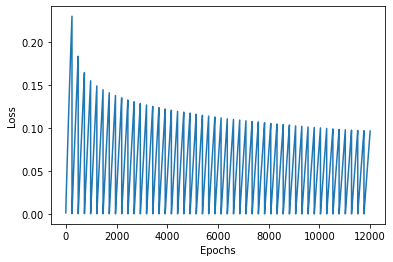

In [43]:
plt.plot(loss_record)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [44]:
def evaluate(image):
    attention = np.zeros((train_sequences.shape[1], 64))
    hidden = decoder.reset_state(batch_size=1)
    shape = image_processing(image).shape
    img_input = tf.expand_dims(image_processing(image),0)
    encoded_output = encoder(img_input)
    shape = tokenizer.word_index['<start>']
    decoder_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    generator = []
    for i in range(train_sequences.shape[1]):
        output, state, weights = decoder(encoded_output, decoder_input, hidden)
        attention[i] = tf.reshape(weights, (-1,)).numpy()
        output_id = tf.random.categorical(output, 1)[0][0]
        generator.append(tokenizer.index_word[output_id.numpy()])
        if tokenizer.index_word[output_id.numpy()]=='<end>':
            return generator, attention
        decoder_input = tf.expand_dims([output_id], 0)
        
    attention = attention[:len(generator),:]
    return generator, attention

In [45]:
test_list = list(set(image_caption.keys()).difference(set(keys)))

tf.Tensor(57, shape=(), dtype=int64)
tf.Tensor(38, shape=(), dtype=int64)
tf.Tensor(18, shape=(), dtype=int64)
tf.Tensor(308, shape=(), dtype=int64)
tf.Tensor(1071, shape=(), dtype=int64)
tf.Tensor(731, shape=(), dtype=int64)
tf.Tensor(18, shape=(), dtype=int64)
tf.Tensor(30, shape=(), dtype=int64)
tf.Tensor(5, shape=(), dtype=int64)
tf.Tensor(1639, shape=(), dtype=int64)
tf.Tensor(2840, shape=(), dtype=int64)
tf.Tensor(21, shape=(), dtype=int64)
tf.Tensor(508, shape=(), dtype=int64)
tf.Tensor(1639, shape=(), dtype=int64)
tf.Tensor(783, shape=(), dtype=int64)
tf.Tensor(4, shape=(), dtype=int64)
Real Caption: <start> Four large men are eating together in what looks like a food-eating contest . <end>,<start> Four men with beards standing up and holding white plates . <end>,<start> Four men are eating off of small white plates . <end>,<start> Several men are eating off plates . <end>,<start> Men compete in an eating contest . <end>

Prediction Caption: three men are making funny costumes 

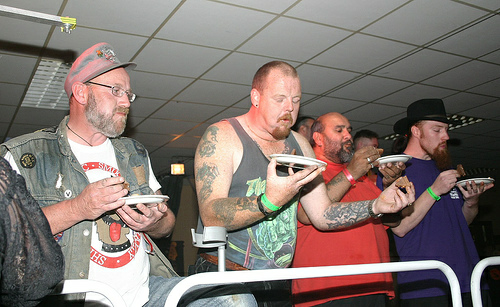

In [46]:
rid = np.random.randint(0, len(test_list))
image = test_list[rid]
real_caption = ','.join(image_caption[image])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print('')
print ('Prediction Caption:', ' '.join(result))
#Image.open(image)
#plota(image, result, attention_plot)
image = tf.io.read_file(image)
image = tf.image.decode_jpeg(image, channels=3)
image = tf.keras.preprocessing.image.array_to_img(image)
image

In [106]:
def plota(image, generator, attention):
    image_np = np.array(Image.open(image))
    fig = plt.figure(figsize=(10,10))
    len_gen = len(generator)
    for l in range(len_gen):
        temp_att = np.resize(attention[i], (8, 8))
        ax = fig.add_subplot(len_gen//2, len_gen//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(image_np)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()